# Classification of Damage in FEM Model Pipes

This program reads the data from a number of damaged state trials of both finite element models (FEMs) and physical experiments. 
The database of model results is populated by the original signal responses from the model for a number of transducer array locations. The program generates white noise of user-specified properties and time-averages the the noisy responses.
The database of physical experimental results is populated by signal responses picked up by a bus-powered USB. Environmental white noise is a natural inclusion of the signal in this case; therefore a number of trace responses are populated into the database for time-averaging.
All of the trials are marked by their states of damage, and the type of damage variation is specified by the user. Principal Component Analysis (PCA) is used to reduce the dimensionality of the data and clearly present the relation of the damaged state with the PCs. Machine Learning via Support Vector Machines (SVM) is used to determine the optimal number of PCs. It may also be used to classify the data through application of feature extraction methods.

## User Inputs

All of the data is stored in an excel file in which waveguide material properties, crack geometry, FEM mesh, transducer specifications, and other such parameters are identified for each signal. The signals in this file have a sampling frequency of 100 kSa/s and duration of 5 ms. Specify this excel file under filename.

In [720]:
# Stored Data
filename = 'I:/My Drive/USGW Research/Programming/Git Practice/Ultrasonic-Guided-Waves-in-Polyethylene-Pipes/Signals.xlsx'

# Parameters
Pipe_model     = 'Comsol 6.0 Model'
Pipe_physical  = 'Pipe 4'

# Material Properties
Elasticity  = 'Attenuation'
Modulus     = 1.1      # GPa
Poissons    = 0.45     # microstrains/microstrains
Density     = 945      # kg/m^3

# Crack Geometry
Orientation   = 90;      # degrees
Location      = 235;     # mm
Depth         = 21;      # mm
Length        = 2*Depth; # mm
Width         = 2;       # mm
Circumference = 'Outside'

# Mesh
meshmax     = 15;      # mm
meshmin     = 0.5;     # mm
timestep    = 0.005;   # ms

# Transducers
StrainCoefficient = 'd33'
PZTType_model     = 'Point'
PZTType_physical  = 'Piezo-Disc'
Arrays            = ['A','A\'','R\'','R'];
Axes              = [2,4];

# Artificially generated white noise
mean    = 0;
std     = 5e-4;
SNR_dB  = 40               # Desired SNR in decibels

# All variables are frozen except one
variable = 'Depth (mm)'

# Storage of Analysis Results
parent    = 'I:/My Drive/USGW Research/Programming/Git Practice/Ultrasonic-Guided-Waves-in-Polyethylene-Pipes'
directory = 'Depth Damaged States Attenuation Model'

## Import Necessary Modules and Functions

In [721]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
import math
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.decomposition import PCA as RandomizedPCA
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn import preprocessing
from sklearn.metrics import accuracy_score
import pickle
from PIL import Image
import scipy as sp
import scipy.fftpack as fft
from scipy.fft import fft, ifft
from scipy import signal
import pywt
# install lvm-read

Add text and color:

In [722]:
class color:
   PURPLE = '\033[95m'
   CYAN = '\033[96m'
   DARKCYAN = '\033[36m'
   BLUE = '\033[94m'
   GREEN = '\033[92m'
   YELLOW = '\033[93m'
   RED = '\033[91m'
   BOLD = '\033[1m'
   UNDERLINE = '\033[4m'
   END = '\033[0m'

Obtain the frequency domains of all the signals in the dataframe in the form of the Single-Sided Amplitude Spectrums:

In [723]:
def ssas (Fs, time_domain):
    (L,n) = np.shape(time_domain)                # size of the time domain database (number of signals x number of samples)
    T = 1/Fs                                     # Sampling period
    t = np.arange(0,duration+T,T)                # zeroed time axis in seconds
    
    # Power Spectrum
    Y = []
    i = 0
    for index, row in time_domain.iterrows():
        Y.append(fft(row.values))
        i = i + 1
        
    # Normalized magnitude of the power spectrum
    P2 = []
    P1 = []
    i = 0

    while i < L:
        p2                   = abs(Y[i]);              # Double-sided Amplitude Spectrum
        p1                   = p2[0:math.ceil(n/2)];
        p1[1:math.ceil(n/2)] = 2*p1[1:math.ceil(n/2)]; # Single-sided Amplitude Spectrum
        i = i + 1;

        P2.append(p2)
        P1.append(p1)
    
    # Frequency domain dataframe
    f = Fs*list(range(0,math.ceil(n/2)))/n;     # Frequency Axis
    P1 = pd.DataFrame(P1)
    freq_dom_title = []
    for freq in f:
        freq_dom_title.append('Frequency Domain (Hz)')

    header = [freq_dom_title, f]
    P1 = pd.DataFrame(P1)
    P1.columns = header
    
    return P1

Plot all frequency domains on the same grid and color-vode them by damaged state:

In [724]:
def freq_domains_by_ds(freq_bins, colors_dict, transparency, df, grouping_category, title):
    
    # freq_bins is a list of floats, colors_dict is a dictionary with ints for keys and colors string for items, 
    # transparency is a float, df is a pandas dataframe, and grouping_category is a string
    
    # df has frequency attributes that may be extracted using extract_freq_bins
    
#     plt.axis('on')
    fig, ax = plt.subplots(figsize = (15,10))

    grouped = df.groupby(grouping_category)

    for freq in freq_bins:
        x1 = np.ones(len(df.index))
        x1 = x1*freq
        df['Frequency (Hz)'] = x1
        for key, group in grouped:
            group.plot(ax=ax, kind='scatter', x=freq, y=df[freq], alpha = transparency, color=colors[key])
    
    plt.legend(colors_dict.keys());
    ax.set_ylabel('Single Sided Amplitude Spectrum', fontsize = 15)
    ax.set_xlabel('Frequency (Hz)', fontsize = 15)    
    ax.set_title(title, fontsize = 20)
#     fig.suptitle('Frequency Domain Response by Damaged State',fontsize = 15)
    plt.grid(which='major', linestyle='-')    
    plt.show()
    
#     df = df.drop('Frequency (Hz)', axis=1)
        
    return fig, ax

Run a preliminary PCA which reduces the dataset from a high-order number of variables to 2 PCs. This function provides the explained variance, plots the components on a coordinate grid, and presents teh expleained variance vs number of components:

In [725]:
def prePCA (freq_data):
    pca = RandomizedPCA(n_components=2)
    pca.fit(freq_data)
    freq_data_pca = pca.transform(freq_data)
    print("original shape:   ", freq_data.shape)
    print("transformed shape:", freq_data_pca.shape)
    label = "Variance explained by each principal component \nPC1: " + str(pca.explained_variance_ratio_[0]) + ' \nPC2: '+ str(pca.explained_variance_ratio_[1])
    print(label)
    
    fig, ax = plt.subplots(2,figsize=(10,10))
    
    comps = pca.components_
    ax[0].scatter(freq_data_pca[:,0],freq_data_pca[:,1])
    ax[0].set_xlabel('Component 1')
    ax[0].set_ylabel('Component 2');
    
    pca = RandomizedPCA().fit(freq_data)
    ax[1].plot(np.cumsum(pca.explained_variance_ratio_))
    ax[1].set_xlabel('Number of components')
    ax[1].set_ylabel('Cumulative explained variance');
    
    ax[1].text(0, 1, label)
    
    return pca, comps, freq_data_pca

Categorize train and test data using SVM. This code uses the grid-search method to optimize the number of PCs. Hyperparameter tuning is employed to run multiple trials and compare accuracies to a subset of trained data.

In [726]:
def pca_svm (n_components):
    pca = RandomizedPCA(n_components)
    pca.fit(x)
    # pca.transform(x)
    svc = SVC(kernel='rbf')
    basemodel = make_pipeline(pca, svc)
    
    param_grid = {'svc__C': np.logspace(np.log10(0.001), np.log10(20), num=200),
                  'svc__gamma': ['auto']}
    grid = GridSearchCV(basemodel, param_grid, cv = 5, n_jobs = 2, verbose = 0)
    lab_enc = preprocessing.LabelEncoder()
    ytrain_encoded = lab_enc.fit_transform(ytrain)
    ytest_encoded = lab_enc.fit_transform(ytest)
    grid.fit(Xtrain, ytrain_encoded)

    svc_model = grid.best_estimator_
    yfit = svc_model.predict(Xtest)
    classification = classification_report(ytest_encoded, yfit)
    accuacy = accuracy_score(ytest_encoded, yfit)
    
    freq_data_pca = pca.transform(x)
    return classification, accuacy, freq_data_pca, svc_model

This is the testing dataset's accuracy. To get the training dataset's accuracy, just replace Xtest with Xtrain. We're expecting testing accuracy to be lower if we have a much bigger starting database size, but in this case both the testing and training data accuracies are good characterizations of the model's accuracy. If both datasets provide a good accuracy, overfitting may not be a problem.

## Point to Directory

In [727]:
cwd = os.getcwd
print(os.getcwd())

I:\My Drive\USGW Research\Programming\Git Practice\Ultrasonic-Guided-Waves-in-Polyethylene-Pipes\Depth Damaged States Attenuation Model


In [728]:
os.chdir(parent)

## Initialize Data Matrices

The user-specified filepath above must be .xlsx

The data incorporated within the database includes interval data representing the time-domains of the response signals, the single-sided amplitude spectrum over a specified frequency range, details on the transducers and crack orientations, information on the pipe and geometries, and other such data.

In [729]:
sheetname = '10 kHz 100 kSa-s 5 ms'
damage    = pd.read_excel(filename, sheetname, header = [0,1]);
damage.head(10)

Pipe                                           \
         Designation Elasticity Modulus (GPa) Poisson's Ratio   
0  Comsol 5.3a Model    Elastic           1.1            0.45   
1  Comsol 5.3a Model    Elastic           1.1            0.45   
2  Comsol 5.3a Model    Elastic           1.1            0.45   
3  Comsol 5.3a Model    Elastic           1.1            0.45   
4  Comsol 5.3a Model    Elastic           1.1            0.45   
5  Comsol 5.3a Model    Elastic           1.1            0.45   
6  Comsol 5.3a Model    Elastic           1.1            0.45   
7  Comsol 5.3a Model    Elastic           1.1            0.45   
8  Comsol 5.3a Model    Elastic           1.1            0.45   
9  Comsol 5.3a Model    Elastic           1.1            0.45   

                    Transducer                                   \
  Density (kg/m^3) Designation Axis Strain Coefficient PZT Type   
0              945           A  1.0                d33    Point   
1              945           A  2.0                d33    Point   
2              945           A  3.0                d33    Point   
3              945           A  4.0                d33    Point   
4              945           A  1.5                d33    Point   
5              945           A  2.5                d33    Point   
6              945           A  3.5                d33    Point   
7              945           A  4.5                d33    Point   
8              945          A'  1.0                d33    Point   
9              945          A'  2.0                d33    Point   

                  Mesh  ... Time Domain (ms)                                \
  Max Edge Length (mm)  ...             4.94      4.95      4.96      4.97   
0                   15  ...        -0.000208 -0.000116  0.000047  0.000227   
1                   15  ...        -0.000035  0.000072  0.000186  0.000278   
2                   15  ...        -0.000214 -0.000083  0.000089  0.000242   
3                   15  ...        -0.000396 -0.000343 -0.000144  0.000122   
4                   15  ...        -0.003529 -0.002902  0.001397  0.000892   
5                   15  ...        -0.003550 -0.002944 -0.001379  0.000761   
6                   15  ...        -0.003457 -0.002660 -0.001025  0.001021   
7                   15  ...        -0.003512 -0.002713  0.001083  0.001013   
8                   15  ...        -0.010845  0.002548  0.014823  0.021428   
9                   15  ...        -0.011807  0.001015  0.013210  0.020338   

                                             
       4.98      4.99         5 5.1 5.2 5.3  
0  0.000362  0.000408  0.000352 NaN NaN NaN  
1  0.000320  0.000297  0.000208 NaN NaN NaN  
2  0.000323  0.000309  0.000209 NaN NaN NaN  
3  0.000352  0.000463  0.000422 NaN NaN NaN  
4  0.002835  0.004254  0.004648 NaN NaN NaN  
5  0.002819  0.004252  0.004644 NaN NaN NaN  
6  0.002886  0.004062  0.004225 NaN NaN NaN  
7  0.002901  0.004108  0.004268 NaN NaN NaN  
8  0.020023  0.011392 -0.000907 NaN NaN NaN  
9  0.019946  0.012490  0.001093 NaN NaN NaN  

[10 rows x 523 columns]

In [730]:
damage

Pipe                                             \
            Designation   Elasticity Modulus (GPa) Poisson's Ratio   
0     Comsol 5.3a Model      Elastic           1.1            0.45   
1     Comsol 5.3a Model      Elastic           1.1            0.45   
2     Comsol 5.3a Model      Elastic           1.1            0.45   
3     Comsol 5.3a Model      Elastic           1.1            0.45   
4     Comsol 5.3a Model      Elastic           1.1            0.45   
...                 ...          ...           ...             ...   
6287   Comsol 6.0 Model  Attenuation           1.1            0.45   
6288   Comsol 6.0 Model  Attenuation           1.1            0.45   
6289   Comsol 6.0 Model  Attenuation           1.1            0.45   
6290   Comsol 6.0 Model  Attenuation           1.1            0.45   
6291   Comsol 6.0 Model  Attenuation           1.1            0.45   

                       Transducer                                   \
     Density (kg/m^3) Designation Axis Strain Coefficient PZT Type   
0                 945           A  1.0                d33    Point   
1                 945           A  2.0                d33    Point   
2                 945           A  3.0                d33    Point   
3                 945           A  4.0                d33    Point   
4                 945           A  1.5                d33    Point   
...               ...         ...  ...                ...      ...   
6287              945           R  4.0                d33    Point   
6288              945           R  1.5                d33    Point   
6289              945           R  2.5                d33    Point   
6290              945           R  3.5                d33    Point   
6291              945           R  4.5                d33    Point   

                     Mesh  ... Time Domain (ms)                                \
     Max Edge Length (mm)  ...             4.94      4.95      4.96      4.97   
0                      15  ...        -0.000208 -0.000116  0.000047  0.000227   
1                      15  ...        -0.000035  0.000072  0.000186  0.000278   
2                      15  ...        -0.000214 -0.000083  0.000089  0.000242   
3                      15  ...        -0.000396 -0.000343 -0.000144  0.000122   
4                      15  ...        -0.003529 -0.002902  0.001397  0.000892   
...                   ...  ...              ...       ...       ...       ...   
6287                   15  ...         0.000004  0.000005  0.000005  0.000005   
6288                   15  ...        -0.000009 -0.000007 -0.000005 -0.000003   
6289                   15  ...         0.000009  0.000007  0.000005  0.000004   
6290                   15  ...         0.000014  0.000014  0.000013  0.000012   
6291                   15  ...        -0.000014 -0.000014 -0.000014 -0.000014   

                                                
          4.98      4.99         5 5.1 5.2 5.3  
0     0.000362  0.000408  0.000352 NaN NaN NaN  
1     0.000320  0.000297  0.000208 NaN NaN NaN  
2     0.000323  0.000309  0.000209 NaN NaN NaN  
3     0.000352  0.000463  0.000422 NaN NaN NaN  
4     0.002835  0.004254  0.004648 NaN NaN NaN  
...        ...       ...       ...  ..  ..  ..  
6287  0.000005  0.000004  0.000004 NaN NaN NaN  
6288 -0.000003 -0.000004 -0.000006 NaN NaN NaN  
6289  0.000005  0.000007  0.000008 NaN NaN NaN  
6290  0.000011  0.000009  0.000008 NaN NaN NaN  
6291 -0.000013 -0.000011 -0.000010 NaN NaN NaN  

[6292 rows x 523 columns]

Extract the signal's discrete time axis:

In [731]:
time = np.array(damage['Time Domain (ms)'].columns)

Zoom in only on one part of the time domain (0-3 ms in this case)

In [732]:
for timestamp in time:
    if (float(timestamp) >= 3.00):
        # print(timestamp in damage['Time Domain (ms)'].columns)
        damage = damage.drop(timestamp, axis=1, level = 1)

time = np.array(damage['Time Domain (ms)'].columns)

np.shape(damage)

(6292, 319)

## Data Processing

Elaborate definiations for visualization:

In [733]:
if StrainCoefficient == 'd33':
    disps = 'Radial Displacements'
elif StrainCoefficient == 'd31':
    disps = 'Axial Displacements'

### Parameter Dictionaries

In [734]:
mat_props = {}

mat_props['Elasticity']       = Elasticity;
mat_props['Modulus (GPa)']    = Modulus;
mat_props['Poisson\'s Ratio'] = Poissons;
mat_props['Density (kg/m^3)'] = Density

mat_props

{'Elasticity': 'Attenuation',
 'Modulus (GPa)': 1.1,
 "Poisson's Ratio": 0.45,
 'Density (kg/m^3)': 945}

In [735]:
crack_geom = {}

crack_geom['Circumference']         = Circumference;
crack_geom['Axial Location (mm)']   = Location;
crack_geom['Orientation (degrees)'] = Orientation;
crack_geom['Depth (mm)']            = Depth;
crack_geom['Length (mm)']           = Length;
crack_geom['Thickness (mm)']        = Width;

crack_geom

{'Circumference': 'Outside',
 'Axial Location (mm)': 235,
 'Orientation (degrees)': 90,
 'Depth (mm)': 21,
 'Length (mm)': 42,
 'Thickness (mm)': 2}

In [736]:
transducer = {}

transducer['Strain Coefficient'] = StrainCoefficient
transducer['Model Type']         = PZTType_model
transducer['Physical Type']      = PZTType_physical

transducer

{'Strain Coefficient': 'd33',
 'Model Type': 'Point',
 'Physical Type': 'Piezo-Disc'}

In [737]:
intervals = {}

intervals['Max Edge Length (mm)'] = meshmax
intervals['Min Edge Length (mm)'] = meshmin
intervals['Time Step (ms)']       = timestep

intervals

{'Max Edge Length (mm)': 15,
 'Min Edge Length (mm)': 0.5,
 'Time Step (ms)': 0.005}

### Boolean Markers

In [738]:
mat_props_params  = list(mat_props.keys())
crack_geom_params = list(crack_geom.keys())
intervals_params  = list(intervals.keys())

In [739]:
is_pipe       = damage['Pipe','Designation']               == Pipe_model
is_sc         = damage['Transducer','Strain Coefficient']  == StrainCoefficient
is_pzttype    = damage['Transducer','PZT Type']            == PZTType_model

### Undamaged State

The undamaged state sees no variability in the parameters simply because it's a single state. Therefore, highlight this state by specifying no crack and the user-defined material, ultrasonic, and interval paramters above.

In [740]:
is_undamaged  = damage['Crack Properties','Depth (mm)']   == 0; # ie no crack

undamaged = damage[is_pipe & is_sc & is_pzttype]
undamaged = undamaged[is_undamaged]

for param in mat_props_params:
    undamaged = undamaged[undamaged['Pipe',param] == mat_props[param]]

for param in intervals_params:    
    undamaged = undamaged[undamaged['Mesh',param] == intervals[param]]
    
undamaged

C:\Users\MEH-3\AppData\Local\Temp/ipykernel_14660/4294524734.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  undamaged = undamaged[is_undamaged]


Pipe                                             \
           Designation   Elasticity Modulus (GPa) Poisson's Ratio   
6260  Comsol 6.0 Model  Attenuation           1.1            0.45   
6261  Comsol 6.0 Model  Attenuation           1.1            0.45   
6262  Comsol 6.0 Model  Attenuation           1.1            0.45   
6263  Comsol 6.0 Model  Attenuation           1.1            0.45   
6264  Comsol 6.0 Model  Attenuation           1.1            0.45   
6265  Comsol 6.0 Model  Attenuation           1.1            0.45   
6266  Comsol 6.0 Model  Attenuation           1.1            0.45   
6267  Comsol 6.0 Model  Attenuation           1.1            0.45   
6268  Comsol 6.0 Model  Attenuation           1.1            0.45   
6269  Comsol 6.0 Model  Attenuation           1.1            0.45   
6270  Comsol 6.0 Model  Attenuation           1.1            0.45   
6271  Comsol 6.0 Model  Attenuation           1.1            0.45   
6272  Comsol 6.0 Model  Attenuation           1.1            0.45   
6273  Comsol 6.0 Model  Attenuation           1.1            0.45   
6274  Comsol 6.0 Model  Attenuation           1.1            0.45   
6275  Comsol 6.0 Model  Attenuation           1.1            0.45   
6276  Comsol 6.0 Model  Attenuation           1.1            0.45   
6277  Comsol 6.0 Model  Attenuation           1.1            0.45   
6278  Comsol 6.0 Model  Attenuation           1.1            0.45   
6279  Comsol 6.0 Model  Attenuation           1.1            0.45   
6280  Comsol 6.0 Model  Attenuation           1.1            0.45   
6281  Comsol 6.0 Model  Attenuation           1.1            0.45   
6282  Comsol 6.0 Model  Attenuation           1.1            0.45   
6283  Comsol 6.0 Model  Attenuation           1.1            0.45   
6284  Comsol 6.0 Model  Attenuation           1.1            0.45   
6285  Comsol 6.0 Model  Attenuation           1.1            0.45   
6286  Comsol 6.0 Model  Attenuation           1.1            0.45   
6287  Comsol 6.0 Model  Attenuation           1.1            0.45   
6288  Comsol 6.0 Model  Attenuation           1.1            0.45   
6289  Comsol 6.0 Model  Attenuation           1.1            0.45   
6290  Comsol 6.0 Model  Attenuation           1.1            0.45   
6291  Comsol 6.0 Model  Attenuation           1.1            0.45   

                       Transducer                                   \
     Density (kg/m^3) Designation Axis Strain Coefficient PZT Type   
6260              945           A  1.0                d33    Point   
6261              945           A  2.0                d33    Point   
6262              945           A  3.0                d33    Point   
6263              945           A  4.0                d33    Point   
6264              945           A  1.5                d33    Point   
6265              945           A  2.5                d33    Point   
6266              945           A  3.5                d33    Point   
6267              945           A  4.5                d33    Point   
6268              945          A'  1.0                d33    Point   
6269              945          A'  2.0                d33    Point   
6270              945          A'  3.0                d33    Point   
6271              945          A'  4.0                d33    Point   
6272              945          A'  1.5                d33    Point   
6273              945          A'  2.5                d33    Point   
6274              945          A'  3.5                d33    Point   
6275              945          A'  4.5                d33    Point   
6276              945          R'  1.0                d33    Point   
6277              945          R'  2.0                d33    Point   
6278              945          R'  3.0                d33    Point   
6279              945          R'  4.0                d33    Point   
6280              945          R'  1.5                d33    Point   
6281              945          R'  2.5                d33    

### Damaged States at the Variablity of a Single Parameter

Highlight the damaged states of interest by specifying the user-defined crack geometry, material, ultrasonic, and interval parameters above. Everything is frozen except the parameter of interest.

Exception: If the parameter of interest is the crack depth, then the crack length is also variable and vice-versa. It's unrealistic to expect that one would vary and not the other in a real-world damage scenario.

In [741]:
damaged = damage[is_pipe & is_sc & is_pzttype]

if variable in mat_props_params:
    mat_props_params.remove(variable)
    
elif variable in crack_geom_params:
    crack_geom_params.remove(variable)
    if variable == 'Depth (mm)':
        crack_geom_params.remove('Length (mm)')
        
elif variable in intervals_params:
    intervals_params.remove(variable)

for param in mat_props_params:
    damaged = damaged[damaged['Pipe',param] == mat_props[param]]

for param in crack_geom_params:
    damaged = damaged[damaged['Crack Properties',param] == crack_geom[param]]

for param in intervals_params:    
    damaged = damaged[damaged['Mesh',param] == intervals[param]]

damaged

Pipe                                             \
           Designation   Elasticity Modulus (GPa) Poisson's Ratio   
5940  Comsol 6.0 Model  Attenuation           1.1            0.45   
5941  Comsol 6.0 Model  Attenuation           1.1            0.45   
5942  Comsol 6.0 Model  Attenuation           1.1            0.45   
5943  Comsol 6.0 Model  Attenuation           1.1            0.45   
5944  Comsol 6.0 Model  Attenuation           1.1            0.45   
...                ...          ...           ...             ...   
6255  Comsol 6.0 Model  Attenuation           1.1            0.45   
6256  Comsol 6.0 Model  Attenuation           1.1            0.45   
6257  Comsol 6.0 Model  Attenuation           1.1            0.45   
6258  Comsol 6.0 Model  Attenuation           1.1            0.45   
6259  Comsol 6.0 Model  Attenuation           1.1            0.45   

                       Transducer                                   \
     Density (kg/m^3) Designation Axis Strain Coefficient PZT Type   
5940              945           A  1.0                d33    Point   
5941              945           A  2.0                d33    Point   
5942              945           A  3.0                d33    Point   
5943              945           A  4.0                d33    Point   
5944              945           A  1.5                d33    Point   
...               ...         ...  ...                ...      ...   
6255              945           R  4.0                d33    Point   
6256              945           R  1.5                d33    Point   
6257              945           R  2.5                d33    Point   
6258              945           R  3.5                d33    Point   
6259              945           R  4.5                d33    Point   

                     Mesh  ... Time Domain (ms)                                \
     Max Edge Length (mm)  ...              2.9      2.91      2.92      2.93   
5940                   15  ...         0.000014  0.000008  0.000002 -0.000004   
5941                   15  ...         0.000011  0.000006  0.000002 -0.000003   
5942                   15  ...         0.000016  0.000013  0.000009  0.000005   
5943                   15  ...         0.000019  0.000014  0.000009  0.000004   
5944                   15  ...         0.000088  0.000058  0.000026 -0.000008   
...                   ...  ...              ...       ...       ...       ...   
6255                   15  ...         0.000007  0.000006  0.000006  0.000004   
6256                   15  ...         0.000025  0.000029  0.000031  0.000032   
6257                   15  ...         0.000026  0.000029  0.000032  0.000032   
6258                   15  ...         0.000026  0.000029  0.000031  0.000031   
6259                   15  ...        -0.000028 -0.000031 -0.000032 -0.000032   

                                                                          
              2.94      2.95          2.96      2.97      2.98      2.99  
5940 -1.000000e-05 -0.000015 -2.010000e-05 -0.000024 -0.000027 -0.000028  
5941 -7.900000e-06 -0.000012 -1.580000e-05 -0.000019 -0.000021 -0.000022  
5942  7.780000e-07 -0.000003 -7.380000e-06 -0.000011 -0.000014 -0.000017  
5943 -1.480000e-06 -0.000007 -1.180000e-05 -0.000016 -0.000020 -0.000023  
5944 -3.990000e-05 -0.000070 -9.700000e-05 -0.000120 -0.000137 -0.000148  
...            ...       ...           ...       ...       ...       ...  
6255  3.090000e-06  0.000002  2.030000e-07 -0.000001 -0.000002 -0.000003  
6256  3.140000e-05  0.000030  2.690000e-05  0.000023  0.000018 -0.000013  
6257  3.180000e-05  0.000030 -2.670000e-05 -0.000023 -0.000017 -0.000012  
6258  3.040000e-05  0.000028 -2.480000e-05 -0.000020 -0.000015 -0.000010  
6259 -3.080000e-05 -0.000028 -2.410000e-05 -0.000019  0.000013  0.000007  

[320 rows x 319 columns]

Combine the undamaged and damaged dataframes into a single dataframe. Sort the rows of the database so that the data is populated in ascending order of damaged state. Undamaged is first.

In [742]:
undamaged   = undamaged.replace({'-': -1}, regex = True)

if variable in mat_props.keys():
    damaged = damaged.sort_values(by=[('Pipe',variable)])
elif variable in crack_geom.keys():
    damaged = damaged.sort_values(by=[('Crack Properties',variable)])
elif variable in mesh_sizes.keys():
    damaged = damaged.sort_values(by=[('Mesh',variable)])
# damaged     = damaged.sort_values(by=[('Crack Properties',variable)])

this_damage = pd.concat([undamaged,damaged])

this_damage = this_damage.replace({-1: '-'}, regex = True)

this_damage

Pipe                                             \
           Designation   Elasticity Modulus (GPa) Poisson's Ratio   
6260  Comsol 6.0 Model  Attenuation           1.1            0.45   
6261  Comsol 6.0 Model  Attenuation           1.1            0.45   
6262  Comsol 6.0 Model  Attenuation           1.1            0.45   
6263  Comsol 6.0 Model  Attenuation           1.1            0.45   
6264  Comsol 6.0 Model  Attenuation           1.1            0.45   
...                ...          ...           ...             ...   
6229  Comsol 6.0 Model  Attenuation           1.1            0.45   
6228  Comsol 6.0 Model  Attenuation           1.1            0.45   
6258  Comsol 6.0 Model  Attenuation           1.1            0.45   
6242  Comsol 6.0 Model  Attenuation           1.1            0.45   
6259  Comsol 6.0 Model  Attenuation           1.1            0.45   

                       Transducer                                   \
     Density (kg/m^3) Designation Axis Strain Coefficient PZT Type   
6260              945           A  1.0                d33    Point   
6261              945           A  2.0                d33    Point   
6262              945           A  3.0                d33    Point   
6263              945           A  4.0                d33    Point   
6264              945           A  1.5                d33    Point   
...               ...         ...  ...                ...      ...   
6229              945           A  2.0                d33    Point   
6228              945           A  1.0                d33    Point   
6258              945           R  3.5                d33    Point   
6242              945          A'  3.5                d33    Point   
6259              945           R  4.5                d33    Point   

                     Mesh  ... Time Domain (ms)                          \
     Max Edge Length (mm)  ...              2.9      2.91          2.92   
6260                   15  ...     1.215200e-05  0.000007  1.683600e-06   
6261                   15  ...    -1.379800e-07 -0.000005 -9.141400e-06   
6262                   15  ...     6.701300e-06  0.000003  8.877500e-08   
6263                   15  ...     1.892400e-05  0.000015  1.050300e-05   
6264                   15  ...     9.053400e-05  0.000056 -2.089300e-05   
...                   ...  ...              ...       ...           ...   
6229                   15  ...     1.270000e-05  0.000008  3.350000e-06   
6228                   15  ...     1.540000e-05  0.000011  6.680000e-06   
6258                   15  ...     2.590000e-05  0.000029  3.080000e-05   
6242                   15  ...     3.740000e-05  0.000035  3.180000e-05   
6259                   15  ...    -2.800000e-05 -0.000031 -3.220000e-05   

                                                                                
          2.93          2.94      2.95      2.96      2.97      2.98      2.99  
6260 -0.000004 -8.816800e-06 -0.000014 -0.000018 -0.000021 -0.000023 -0.000025  
6261 -0.000013 -1.644300e-05 -0.000019 -0.000021 -0.000022 -0.000022 -0.000021  
6262 -0.000003 -6.423100e-06 -0.000009 -0.000012 -0.000014 -0.000015 -0.000016  
6263  0.000006  5.348900e-07 -0.000004 -0.000009 -0.000014 -0.000017 -0.000020  
6264 -0.000018 -5.271800e-05 -0.000085 -0.000114 -0.000137 -0.000154 -0.000165  
...        ...           ...       ...       ...       ...       ...       ...  
6229 -0.000002 -6.250000e-06 -0.000011 -0.000015 -0.000018 -0.000020 -0.000022  
6228  0.000002 -2.890000e-06 -0.000008 -0.000012 -0.000015 -0.000018 -0.000021  
6258  0.000031  3.040000e-05  0.000028 -0.000025 -0.000020 -0.000015 -0.000010  
6242  0.000028  2.350000e-05  0.000019  0.000017  0.000016 -0.000019 -0.000023  
6259 -0.000032 -3.080000e-05 -0.000028 -0.000024 -0.000019  0.000013  0.000007  

[352 rows x 319 columns]

### Single-Sided Amplitude Spectrums

In [743]:
duration = (time.transpose()[-1] - time.transpose()[0])/1000;   # total duration of signal (s)
n = len(time.transpose());                                      # total number of samples in signal (Sa)
Fs = np.array((n-1)/duration);                                  # sampling frequency of signal (Sa/s)
T  = 1/Fs;                                                      # sampling period (s)

(L,n) = np.shape(this_damage['Time Domain (ms)'])               # size of the time domain database (number of signals x number of samples)
n     = np.array(n)                                             # Python is finicky with range
t     = np.arange(0,duration+T,T)                               # zeroed time axis in seconds

In [744]:
P1 = ssas(Fs, this_damage['Time Domain (ms)'])
P1

Frequency Domain (Hz)                                                      \
             0.000000     333.333333   666.666667   1000.000000  1333.333333    
0                0.000015     0.006378     0.011314     0.013595     0.012457   
1                0.000039     0.006327     0.011222     0.013485     0.012365   
2                0.000002     0.006346     0.011263     0.013550     0.012444   
3                0.000055     0.006397     0.011353     0.013656     0.012531   
4                0.004824     0.007329     0.003998     0.008073     0.012643   
..                    ...          ...          ...          ...          ...   
347              0.000025     0.006383     0.011330     0.013617     0.012483   
348              0.000032     0.006393     0.011342     0.013635     0.012504   
349              0.000152     0.000979     0.001286     0.001460     0.001280   
350              0.002270     0.003783     0.002463     0.001915     0.000781   
351              0.000201     0.000997     0.001270     0.001582     0.001074   

                                                                      ...  \
    1666.666667  2000.000000  2333.333333  2666.666667  3000.000000   ...   
0       0.007691     0.000231     0.009874     0.019924     0.030591  ...   
1       0.007651     0.000220     0.009715     0.019441     0.028941  ...   
2       0.007729     0.000143     0.009808     0.019722     0.030137  ...   
3       0.007764     0.000257     0.009986     0.020248     0.031421  ...   
4       0.011398     0.005594     0.009571     0.027882     0.069296  ...   
..           ...          ...          ...          ...          ...  ...   
347     0.007722     0.000213     0.009873     0.019795     0.030671  ...   
348     0.007737     0.000236     0.009917     0.020029     0.030981  ...   
349     0.001568     0.001600     0.002288     0.000937     0.001387  ...   
350     0.004327     0.004628     0.005615     0.003374     0.003813  ...   
351     0.001796     0.001349     0.002561     0.000878     0.001620  ...   

                                                                      \
    46666.666667 47000.000000 47333.333333 47666.666667 48000.000000   
0       0.000118     0.000133     0.000112     0.000064     0.000023   
1       0.000125     0.000141     0.000121     0.000071     0.000022   
2       0.000128     0.000146     0.000125     0.000072     0.000016   
3       0.000122     0.000137     0.000117     0.000067     0.000021   
4       0.000949     0.003010     0.003623     0.003152     0.002652   
..           ...          ...          ...          ...          ...   
347     0.000127     0.000137     0.000118     0.000074     0.000027   
348     0.000121     0.000136     0.000114     0.000065     0.000021   
349     0.000184     0.000263     0.000300     0.000190     0.000370   
350     0.003510     0.005846     0.007327     0.007791     0.007197   
351     0.000142     0.000270     0.000303     0.000180     0.000328   

                                                                      
    48333.333333 48666.666667 49000.000000 49333.333333 49666.666667  
0       0.000074     0.000118     0.000134     0.000116     0.000070  
1       0.000073     0.000120     0.000137     0.000118     0.000070  
2       0.000073     0.000123     0.000140     0.000121     0.000072  
3       0.000073     0.000119     0.000136     0.000117     0.000069  
4       0.001569     0.002213     0.005685     0.006439     0.007646  
..           ...          ...          ...          ...          ...  
347     0.000078     0.000123     0.000134     0.000116     0.000069  
348     0.000074     0.000119     0.000138     0.000120     0.000073  
349     0.000332     0.000156     0.000094     0.000204     0.000302  
350     0.005699     0.003971     0.003198     0.004534     0.006689  
351     0.000349     0.000110     0.000149     0.000157     0.000254  

[352 rows x 150 columns]

Include the Single-Sided Amplitude Spectrum in the damage database

In [745]:
for freq in P1.columns:
    this_damage[freq] = P1[freq].values

this_damage

C:\Users\MEH-3\AppData\Local\Temp/ipykernel_14660/297605895.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  this_damage[freq] = P1[freq].values


Pipe                                             \
           Designation   Elasticity Modulus (GPa) Poisson's Ratio   
6260  Comsol 6.0 Model  Attenuation           1.1            0.45   
6261  Comsol 6.0 Model  Attenuation           1.1            0.45   
6262  Comsol 6.0 Model  Attenuation           1.1            0.45   
6263  Comsol 6.0 Model  Attenuation           1.1            0.45   
6264  Comsol 6.0 Model  Attenuation           1.1            0.45   
...                ...          ...           ...             ...   
6229  Comsol 6.0 Model  Attenuation           1.1            0.45   
6228  Comsol 6.0 Model  Attenuation           1.1            0.45   
6258  Comsol 6.0 Model  Attenuation           1.1            0.45   
6242  Comsol 6.0 Model  Attenuation           1.1            0.45   
6259  Comsol 6.0 Model  Attenuation           1.1            0.45   

                       Transducer                                   \
     Density (kg/m^3) Designation Axis Strain Coefficient PZT Type   
6260              945           A  1.0                d33    Point   
6261              945           A  2.0                d33    Point   
6262              945           A  3.0                d33    Point   
6263              945           A  4.0                d33    Point   
6264              945           A  1.5                d33    Point   
...               ...         ...  ...                ...      ...   
6229              945           A  2.0                d33    Point   
6228              945           A  1.0                d33    Point   
6258              945           R  3.5                d33    Point   
6242              945          A'  3.5                d33    Point   
6259              945           R  4.5                d33    Point   

                     Mesh  ... Frequency Domain (Hz)            \
     Max Edge Length (mm)  ...    46666.666666666664   47000.0   
6260                   15  ...              0.000118  0.000133   
6261                   15  ...              0.000125  0.000141   
6262                   15  ...              0.000128  0.000146   
6263                   15  ...              0.000122  0.000137   
6264                   15  ...              0.000949  0.003010   
...                   ...  ...                   ...       ...   
6229                   15  ...              0.000127  0.000137   
6228                   15  ...              0.000121  0.000136   
6258                   15  ...              0.000184  0.000263   
6242                   15  ...              0.003510  0.005846   
6259                   15  ...              0.000142  0.000270   

                                                                         \
     47333.333333333336 47666.666666666664   48000.0 48333.333333333336   
6260           0.000112           0.000064  0.000023           0.000074   
6261           0.000121           0.000071  0.000022           0.000073   
6262           0.000125           0.000072  0.000016           0.000073   
6263           0.000117           0.000067  0.000021           0.000073   
6264           0.003623           0.003152  0.002652           0.001569   
...                 ...                ...       ...                ...   
6229           0.000118           0.000074  0.000027           0.000078   
6228           0.000114           0.000065  0.000021           0.000074   
6258           0.000300           0.000190  0.000370           0.000332   
6242           0.007327           0.007791  0.007197           0.005699   
6259           0.000303           0.000180  0.000328           0.000349   

                                                                         
     48666.666666666664   49000.0 49333.333333333336 49666.666666666664  
6260           0.000118  0.000134           0.000116           0.000070  
6261           0.000120  0.000137           0.000118           0.000070  
6262           0.000123  0.000140           0.000121           0.000072  
6263

### Damage Database Dictionary

Make sure all the right damaged states are present.

In [746]:
this_damage['Crack Properties',variable].unique()

array([ 0,  2,  4,  6,  8, 10, 12, 14, 16, 18, 20], dtype=int64)

Only the  axes specified by user. All arrays present in dataframe

In [747]:
arrays = this_damage['Transducer','Designation'].unique()
arrays

array(['A', "A'", "R'", 'R'], dtype=object)

In [748]:
damage_by_arrays = {}

for Array in arrays:
    damage_by_arrays[Array] = this_damage[(this_damage['Transducer','Designation'] == Array) & (this_damage['Transducer','Axis'].isin(Axes)) ]
    damage_by_arrays[Array] = damage_by_arrays[Array][damage_by_arrays[Array]['Crack Properties','Depth (mm)'] != 10]   # Take out the 10 mm measurement

# damage_by_arrays

In [749]:
damage_by_arrays[arrays[0]]['Crack Properties',variable].unique()

array([ 0,  2,  4,  6,  8, 12, 14, 16, 18, 20], dtype=int64)

In [750]:
# damage = damage.replace(21,'Through Thickness')

## Plots

Preliminary step to define variables which highlight the damaged states and axes that will be plotted together 

In [751]:
colors = ['red','black','blue','green','purple','orange','magenta','gray']

In [752]:
# this_damage['Frequency (Hz)']
no_ds   = len(damage_by_arrays['A']['Crack Properties'][variable].unique())
no_axes = len(damage_by_arrays['A']['Transducer']['Axis'].unique())

states  = damage_by_arrays['A']['Crack Properties'][variable].unique()
axes    = damage_by_arrays['A']['Transducer']['Axis'].unique()

In [753]:
states = [states for states in states]
states

[0, 2, 4, 6, 8, 12, 14, 16, 18, 20]

In [754]:
axes = [str(axes) for axes in axes]
axes

['2.0', '4.0']

In [755]:
axis_color = {}
i = 0
while i < no_axes:
    axis_color[axes[i]] = colors[i]
    i = i + 1

axis_color

{'2.0': 'red', '4.0': 'black'}

Save the plots in the user-specified directory above. No error is raised if the directory already exists

In [756]:
try: 
    os.mkdir(directory) 
except OSError as error: 
    print(error) 
    
path = os.path.join(directory)
os.chdir(path)

[WinError 183] Cannot create a file when that file already exists: 'Depth Damaged States Attenuation Model'


### Time Domian Plots

Label each graph by its signals' frozen parameters:

In [757]:
crack_props = ''
for crack_geom_param in crack_geom_params:
    crack_props += crack_geom_param + ': ' + str(crack_geom[crack_geom_param]) + '\n'
    
crack_props

'Circumference: Outside\nAxial Location (mm): 235\nOrientation (degrees): 90\nThickness (mm): 2\n'

In [758]:
parameters = Elasticity + '\n' + disps + '\n'
for intervals_param in intervals_params:
    parameters += intervals_param + ': ' + str(intervals[intervals_param]) + '\n'
    
parameters

'Attenuation\nRadial Displacements\nMax Edge Length (mm): 15\nMin Edge Length (mm): 0.5\nTime Step (ms): 0.005\n'

In [759]:
savename = Pipe_model + ' Response ' + Elasticity + ' ' + disps + ' ' + str(meshmin) + '-' + str(meshmax) + ' mm Mesh ' + str(timestep) + ' ms Timestep'
savename += '.png'
savename

'Comsol 6.0 Model Response Attenuation Radial Displacements 0.5-15 mm Mesh 0.005 ms Timestep.png'

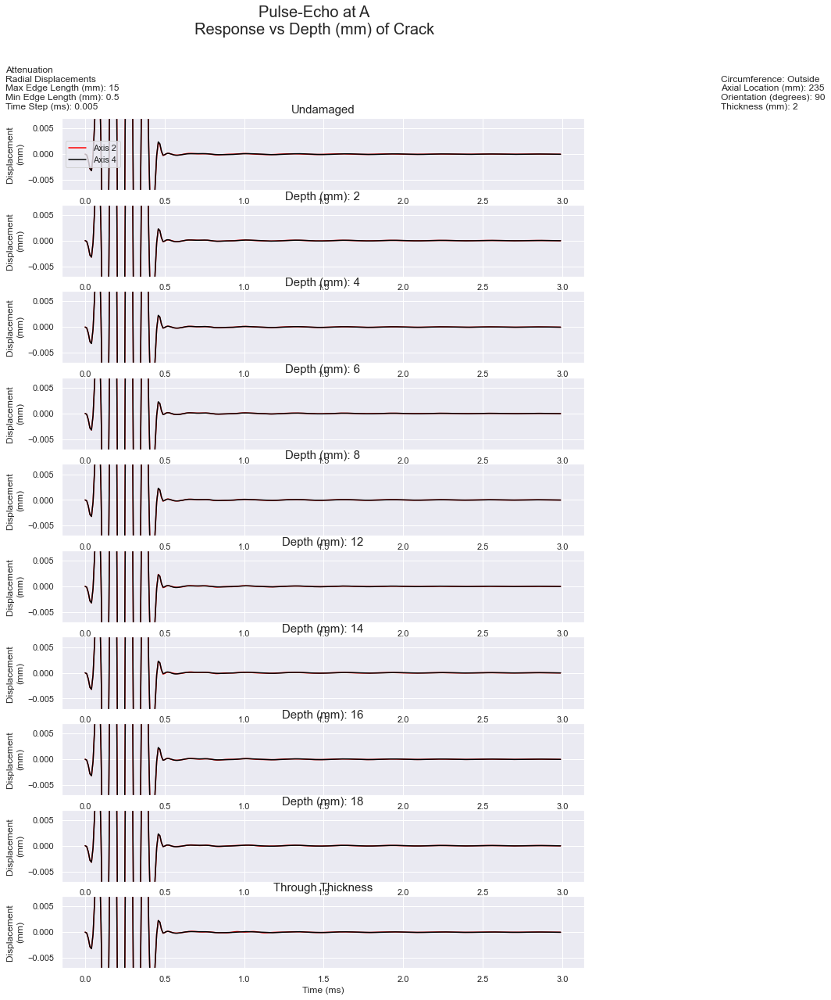

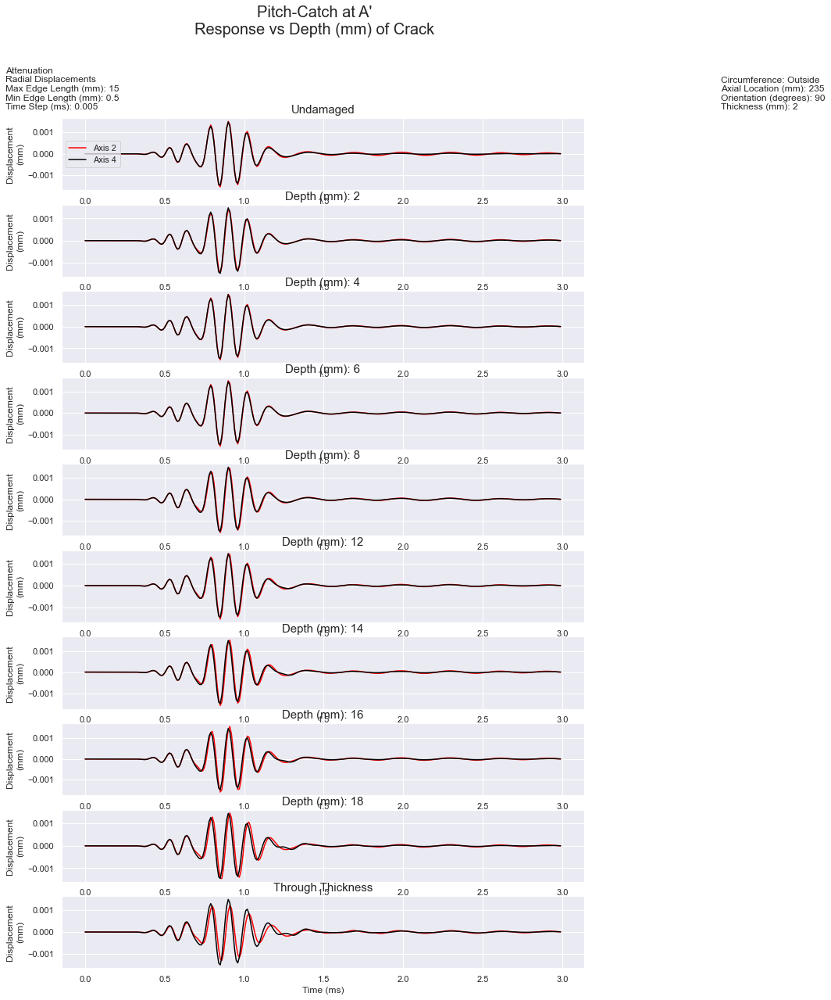

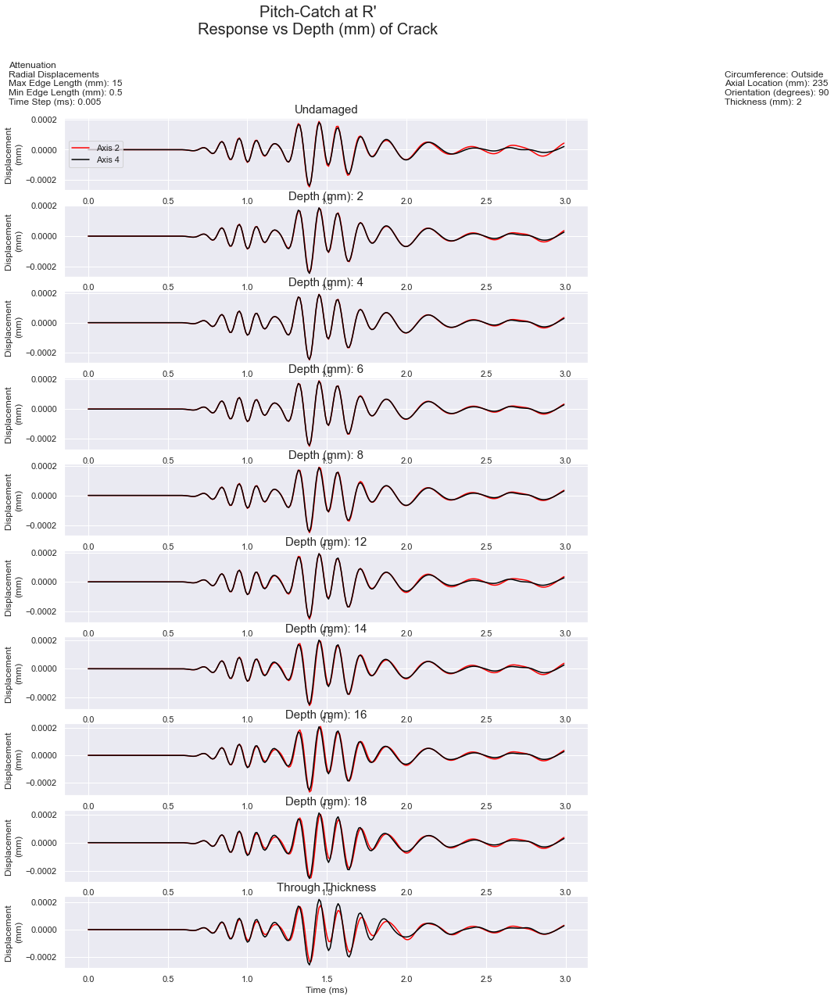

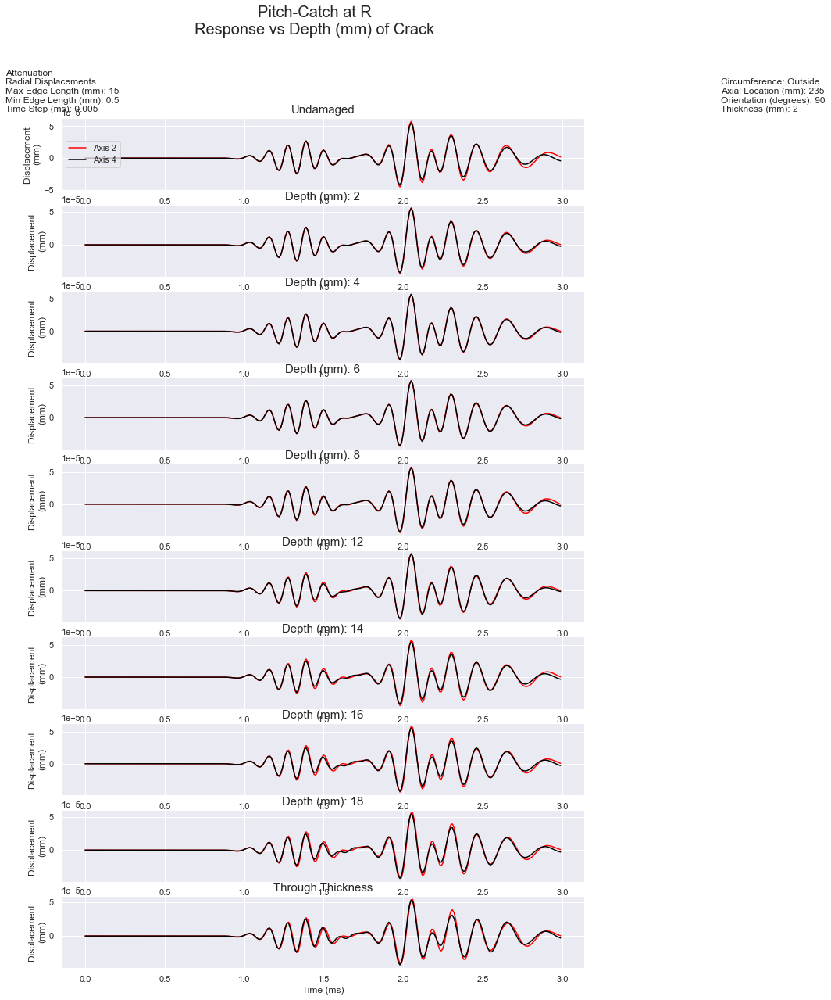

In [760]:
for Array in damage_by_arrays.keys():
    
    if Array == 'A':
        Configuration = 'Pulse-Echo'
    else:
        Configuration = 'Pitch-Catch'
    
    fig, ax = plt.subplots(no_ds, 1, figsize = (12,20))
    i = 0
    
    while i < no_ds:
        state = states[i]
        j = 0;
        subtitle = '';

        while j < no_axes:
            axis = axes[j];

            is_state = damage_by_arrays[Array]['Crack Properties',variable] == states[i];
            is_axis  = damage_by_arrays[Array]['Transducer','Axis'] == float(axes[j]);
            signal   = damage_by_arrays[Array][is_state & is_axis];

            signal_time = signal['Time Domain (ms)'];
            
            if Configuration == 'Pulse-Echo':
                ax[i].set_ylim([-0.007, 0.007])
            
            if np.nan in signal_time:
                continue

            # max_value = max(signal_time.to_numpy().transpose())
            max_value = signal_time.to_numpy().max()
            
            ax[i].plot(time.transpose(),signal_time.to_numpy().transpose() ,color = colors[j], label = 'Axis ' + str(Axes[j]));
            ax[i].set_ylabel('Displacement \n(mm)', fontsize = 12)

            j = j + 1;

        if i == 0:
            subtitle = 'Undamaged'
        elif state >= 20:
            subtitle = 'Through Thickness'
        else:
            subtitle = variable + ': ' + str(states[i])
        ax[i].set_title(subtitle, fontsize = 15)
            
        i = i + 1;

    ax[-1].set_xlabel('Time (ms)', fontsize = 12)

    ax[0].legend(loc = 'center left', ncol = 1)
    
    if Configuration == 'Pulse-Echo':
        textyloc = 0.007;
    else:
        textyloc = max_value*1.1;

    ax[0].text(-0.5, textyloc, parameters, fontsize=12)
    ax[0].text(4, textyloc, crack_props, fontsize=12)

    fig.suptitle(Configuration + ' at '+ Array +'\nResponse vs ' + variable + ' of Crack',fontsize = 20)

    fig.savefig(Array + ' ' + savename,dpi = 250)

### Frequency Domain Plots

In [761]:
savename = Pipe_model + ' Amplitude Spectrum ' + Elasticity + ' ' + disps + ' ' + str(meshmin) + '-' + str(meshmax) + ' mm Mesh ' + str(timestep) + ' ms Timestep'
savename += '.png'
savename

'Comsol 6.0 Model Amplitude Spectrum Attenuation Radial Displacements 0.5-15 mm Mesh 0.005 ms Timestep.png'

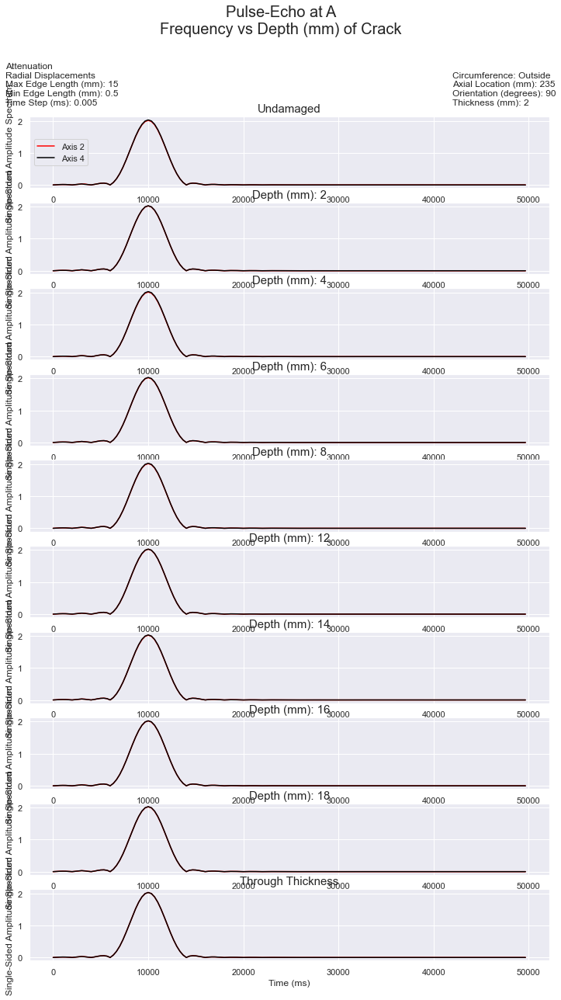

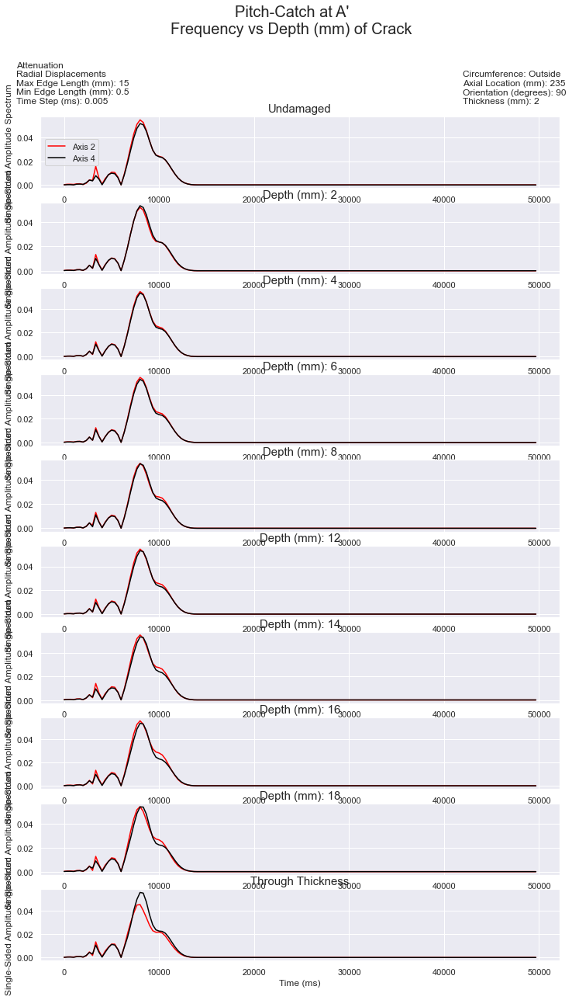

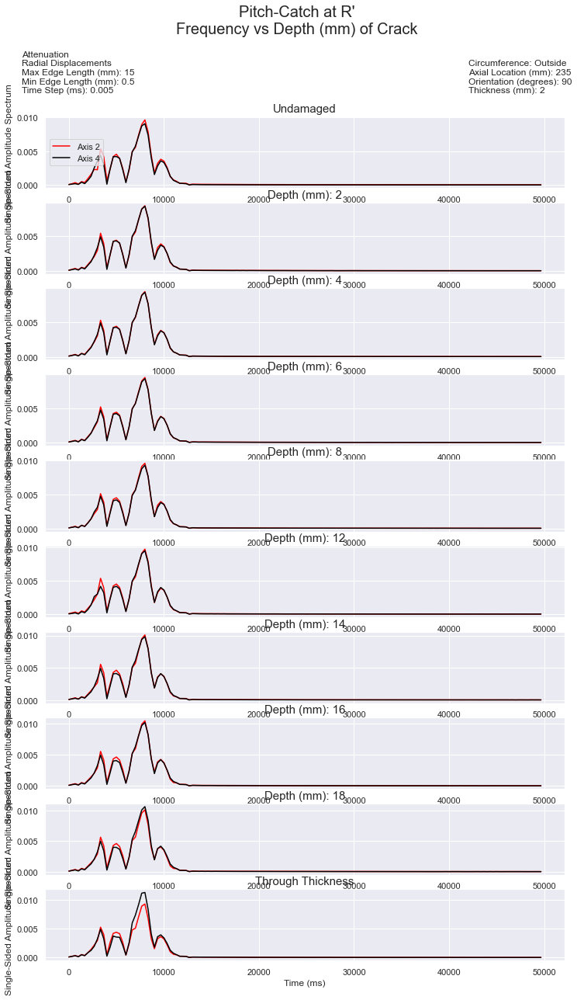

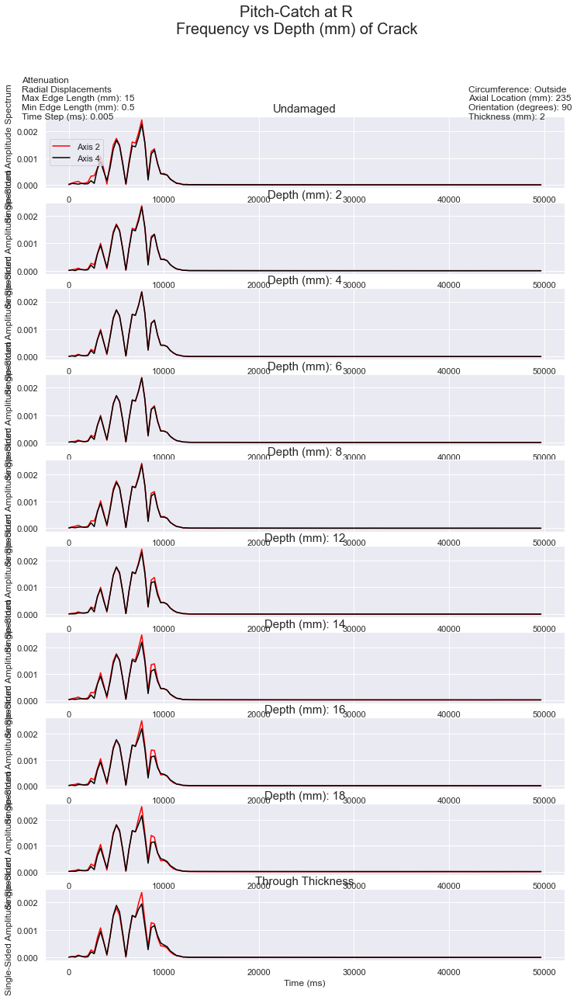

In [762]:
for Array in damage_by_arrays.keys():
    
    if Array == 'A':
        Configuration = 'Pulse-Echo'
    else:
        Configuration = 'Pitch-Catch'
    
    fig, ax = plt.subplots(no_ds, 1, figsize = (12,20))
    i = 0
    
    while i < no_ds:
        state = states[i]
        j = 0;
        subtitle = '';

        while j < no_axes:
            axis = axes[j];

            is_state = damage_by_arrays[Array]['Crack Properties',variable] == states[i];
            is_axis  = damage_by_arrays[Array]['Transducer','Axis'] == float(axes[j]);
            signal   = damage_by_arrays[Array][is_state & is_axis];

            signal_freq = signal['Frequency Domain (Hz)'];
            
            if np.nan in signal_freq:
                continue

            max_value = signal_freq.to_numpy().max()
            
            ax[i].plot(damage_by_arrays[Array]['Frequency Domain (Hz)'].columns,signal_freq.to_numpy().transpose() ,color = colors[j], label = 'Axis ' + str(Axes[j]));
            ax[i].set_ylabel('Single-Sided Amplitude Spectrum', fontsize = 12)

            j = j + 1;

        if i == 0:
            subtitle = 'Undamaged'
        elif state >= 20:
            subtitle = 'Through Thickness'
        else:
            subtitle = variable + ': ' + str(states[i])
        ax[i].set_title(subtitle, fontsize = 15)
            
        i = i + 1;

    ax[-1].set_xlabel('Time (ms)', fontsize = 12)

    ax[0].legend(loc = 'center left', ncol = 1)

    textyloc = max_value*1.1;

    ax[0].text(-5000, textyloc, parameters, fontsize=12)
    ax[0].text(42000, textyloc, crack_props, fontsize=12)

    fig.suptitle(Configuration + ' at '+ Array +'\nFrequency vs ' + variable + ' of Crack',fontsize = 20)

    fig.savefig(Array + ' ' + savename,dpi = 250)

### DWT Spectrogram

The discrete wavelet transform is an operation by which a mother wavelet (Daubacheis 1 in this case) is dilated and shifted across the domain of the signal in order to reconstruct it in a number of different frequencies. 

In [763]:
coeffs = pywt.wavedec(signal_time, 'db1', mode = 'sym', level = 5); # DWT
cA5, cD5, cD4, cD3, cD2, cD1 = coeffs

In [764]:
no_coeffs = 6;

In [765]:
crack_props = ''
for crack_geom_param in crack_geom_params:
    crack_props += crack_geom_param + ': ' + str(crack_geom[crack_geom_param]) + '\n'
    
crack_props

'Circumference: Outside\nAxial Location (mm): 235\nOrientation (degrees): 90\nThickness (mm): 2\n'

In [766]:
parameters = Elasticity + '\n' + disps + '\n'
for intervals_param in intervals_params:
    parameters += intervals_param + ': ' + str(intervals[intervals_param]) + '\n'
    
parameters

'Attenuation\nRadial Displacements\nMax Edge Length (mm): 15\nMin Edge Length (mm): 0.5\nTime Step (ms): 0.005\n'

In [767]:
savename = Pipe_model + ' DWT ' + Elasticity + ' ' + disps + ' ' + str(meshmin) + '-' + str(meshmax) + ' mm Mesh ' + str(timestep) + ' ms Timestep'
savename += '.png'
savename

'Comsol 6.0 Model DWT Attenuation Radial Displacements 0.5-15 mm Mesh 0.005 ms Timestep.png'

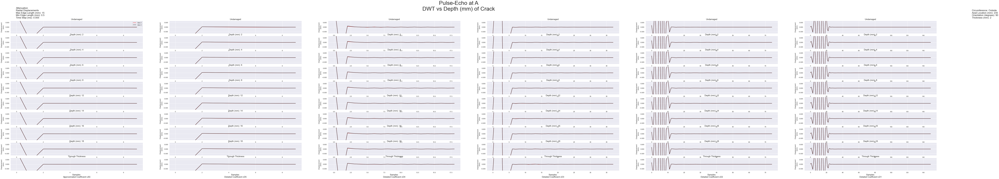

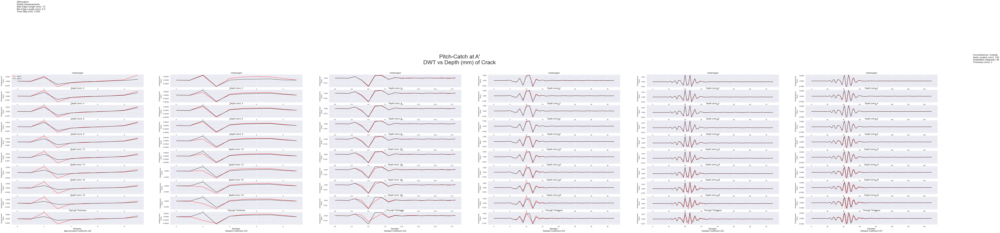

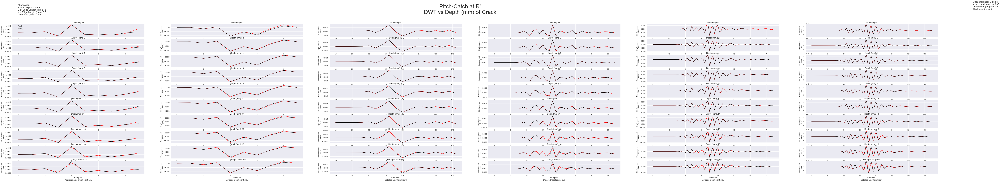

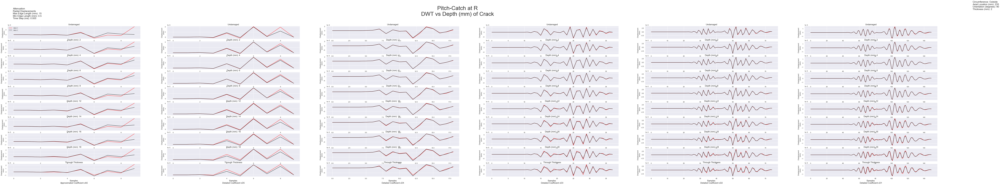

In [768]:
for Array in damage_by_arrays.keys():
    
    if Array == 'A':
        Configuration = 'Pulse-Echo'
    else:
        Configuration = 'Pitch-Catch'
    
    fig, ax = plt.subplots(no_ds, no_coeffs, figsize = (120,20))
    i = 0
    
    while i < no_ds:
        state = states[i]
        j = 0;
        subtitle = '';

        while j < no_axes:
            axis = axes[j];

            is_state = damage_by_arrays[Array]['Crack Properties',variable] == states[i];
            is_axis  = damage_by_arrays[Array]['Transducer','Axis'] == float(axes[j]);
            signal   = damage_by_arrays[Array][is_state & is_axis];

            signal_time = signal['Time Domain (ms)'];
            
            if np.nan in signal_time:
                continue

            max_value = signal_time.to_numpy().max()
            
            coeffs = pywt.wavedec(signal_time, 'db1', mode = 'sym', level = 5); # DWT
            cA5, cD5, cD4, cD3, cD2, cD1 = coeffs
            
            k = 0
            for coeff in coeffs:
                
                if Configuration == 'Pulse-Echo':
                    ax[i][k].set_ylim([-0.007, 0.007])
                
                samples = np.arange(0,len(coeff.transpose()))
                ax[i][k].plot(samples,coeff.transpose() ,color = colors[j], label = 'Axis ' + str(Axes[j]));
                ax[i][k].set_ylabel('Displacement \n(mm)', fontsize = 12)
                                
                if i == 0:
                    subtitle = 'Undamaged'
                elif state >= 20:
                    subtitle = 'Through Thickness'
                else:
                    subtitle = variable + ': ' + str(states[i])
                ax[i][k].set_title(subtitle, fontsize = 15)

                k = k + 1;

            j = j + 1;
            
        i = i + 1;


    ax[0][0].legend(loc = 'best', ncol = 1)
    
    if Configuration == 'Pulse-Echo':
        textyloc = 0.007;
    else:
        textyloc = max_value;

    ax[-1][0].set_xlabel('Samples \nApproximated Coefficient cA5', fontsize = 15)
    ax[-1][1].set_xlabel('Samples \nDetailed Coefficient cD5', fontsize = 15)
    ax[-1][2].set_xlabel('Samples \nDetailed Coefficient cD4', fontsize = 15)
    ax[-1][3].set_xlabel('Samples \nDetailed Coefficient cD3', fontsize = 15)
    ax[-1][4].set_xlabel('Samples \nDetailed Coefficient cD2', fontsize = 15)
    ax[-1][5].set_xlabel('Samples \nDetailed Coefficient cD1', fontsize = 15)
        
    ax[0][0].text(-0.05, textyloc, parameters, fontsize=17)
    ax[0][-1].text(200, textyloc, crack_props, fontsize=17)

    fig.suptitle(Configuration + ' at '+ Array +'\nDWT vs ' + variable + ' of Crack',fontsize = 40)

    fig.savefig(Array + ' ' + savename,dpi = 250)

## Add Noise

In order for the data to be categorized appropriately, there needs to be redundancy for each damaged state. Multiple trials will be created by adding random white noise according to a specified signal to noise ratio (SNR)

In [769]:
num_samples = len(time.transpose())
signals     = damage_by_arrays
snr         = 10**(SNR_dB/10)   # Desired linear SNR

for Array in damage_by_arrays.keys():
    for seed in damage_by_arrays[Array].index:
        signal = damage_by_arrays[Array].loc[seed]
        for i in range(1,101):
            power = signal['Time Domain (ms)'].var()
            n     = power/snr
            noise = sp.sqrt(n)*sp.randn(num_samples)
            noisy_signal = signal;
            noisy_signal['Time Domain (ms)'] = np.add(signal['Time Domain (ms)'],noise).values
            # noisy_signal['Time Domain (ms)'] = np.array(noisy_signal['Time Domain (ms)']) + np.array(noise)
            noisy_signal['Pipe','Designation'] = 'Simulated Noisy Signal';
            signals[Array] = signals[Array].append(noisy_signal)

C:\Users\MEH-3\AppData\Local\Temp/ipykernel_14660/400668688.py:11: DeprecationWarning: scipy.sqrt is deprecated and will be removed in SciPy 2.0.0, use numpy.lib.scimath.sqrt instead
  noise = sp.sqrt(n)*sp.randn(num_samples)
C:\Users\MEH-3\AppData\Local\Temp/ipykernel_14660/400668688.py:11: DeprecationWarning: scipy.randn is deprecated and will be removed in SciPy 2.0.0, use numpy.random.randn instead
  noise = sp.sqrt(n)*sp.randn(num_samples)
C:\Users\MEH-3\Anaconda_Python\lib\site-packages\pandas\core\series.py:1056: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cacher_needs_updating = self._check_is_chained_assignment_possible()
C:\Users\MEH-3\Anaconda_Python\lib\site-packages\pandas\core\indexing.py:1965: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

S

### Time-Averaged Signal Data

Populate a dictionary with signals at the arrays in which the noise is cancelled by averaging the signals over each damaged state. Do the same for a max signal value dictionary and a min signal value dictionary.

In [770]:
averaged_signals = {}
max_signals      = {}
min_signals      = {}

for Array in signals.keys():
    is_noisy = signals[Array]['Pipe','Designation'] == 'Simulated Noisy Signal'
    
    averaged_signals[Array] = signals[Array][is_noisy].groupby([signals[Array][is_noisy]['Crack Properties',variable],signals[Array][is_noisy]['Transducer','Axis']]).mean()
    max_signals[Array]      = signals[Array][is_noisy].groupby([signals[Array][is_noisy]['Crack Properties',variable],signals[Array][is_noisy]['Transducer','Axis']]).max()
    min_signals[Array]      = signals[Array][is_noisy].groupby([signals[Array][is_noisy]['Crack Properties',variable],signals[Array][is_noisy]['Transducer','Axis']]).min()
    

### Frequency Domain over all Noisy Data and Time-Averaged Data

In [771]:
for Array in signals.keys():
    P1_noisy = ssas(Fs, signals[Array]['Time Domain (ms)'])
    for freq in P1_noisy.columns:
        signals[Array][freq] = P1_noisy[freq].values

In [772]:
for Array in averaged_signals.keys():
    P1_averaged = ssas(Fs, averaged_signals[Array]['Time Domain (ms)'])
    for freq in P1_averaged.columns:
        averaged_signals[Array][freq] = P1_averaged[freq].values

### Plot all New Data upon Introduction of Noise

In [773]:
savename = Pipe_model + ' Noisy Response ' + Elasticity + ' ' + disps + ' ' + str(meshmin) + '-' + str(meshmax) + ' mm Mesh ' + str(timestep) + ' ms Timestep'
savename += '.png'
savename

'Comsol 6.0 Model Noisy Response Attenuation Radial Displacements 0.5-15 mm Mesh 0.005 ms Timestep.png'

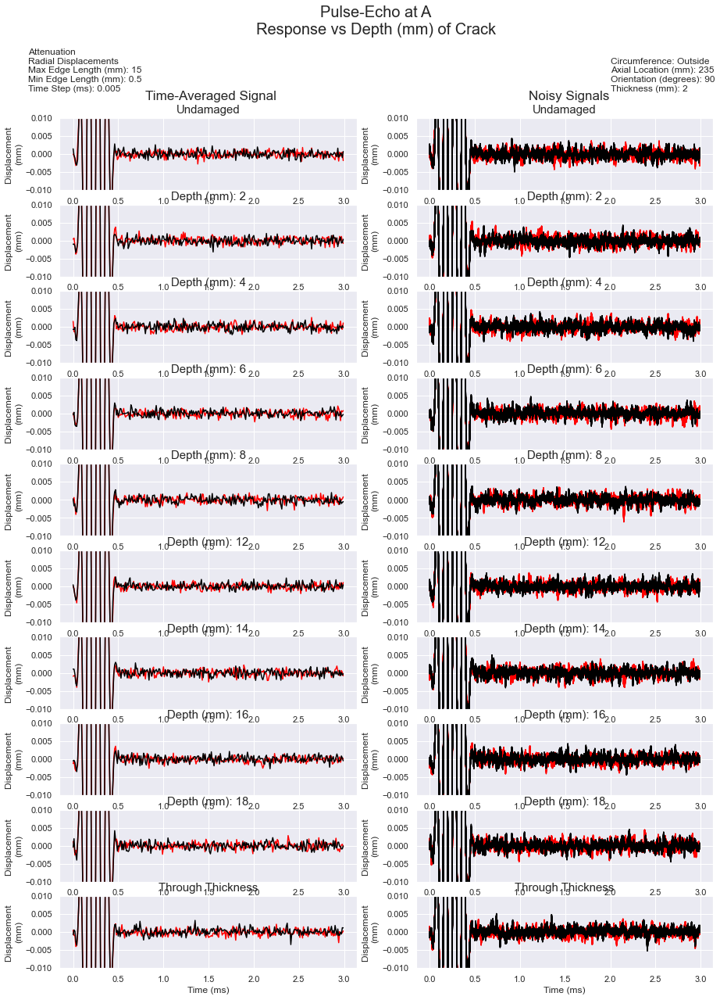

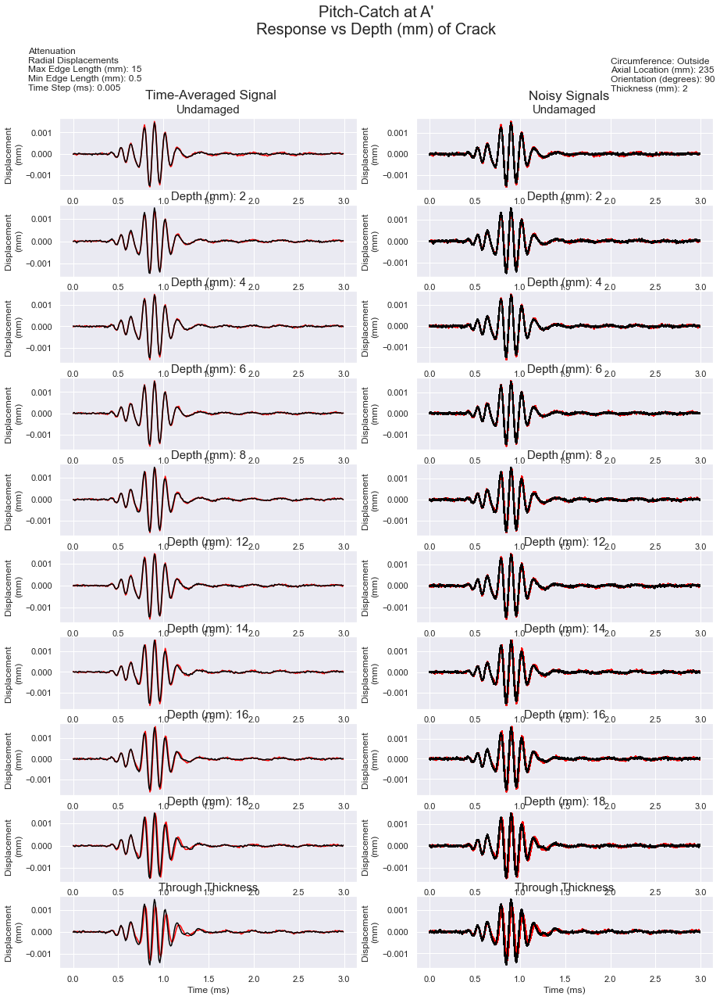

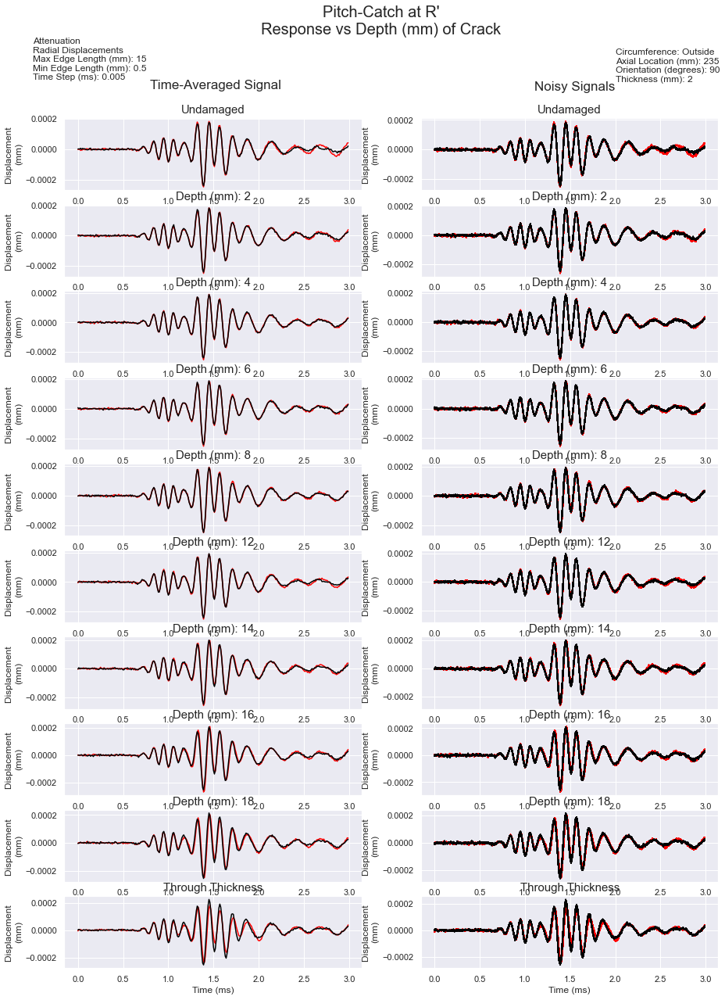

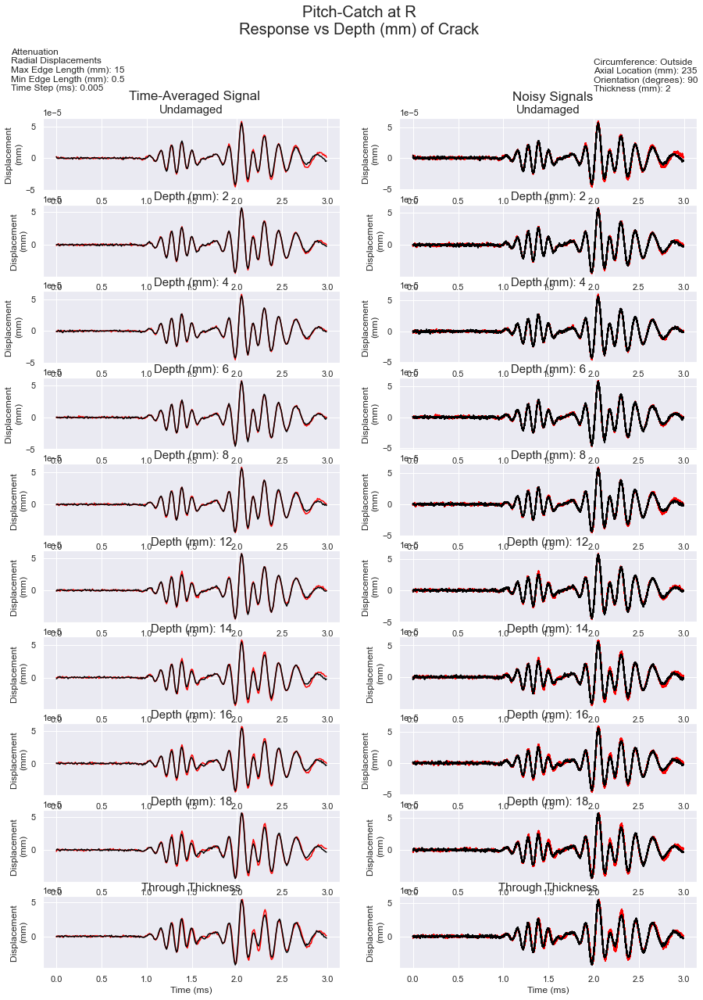

In [774]:
for Array in signals.keys():
    
    if Array == 'A':
        Configuration = 'Pulse-Echo'
    else:
        Configuration = 'Pitch-Catch'
    
    fig, ax = plt.subplots(no_ds, 2, figsize = (15,20))
    i = 0
    
    while i < no_ds:
        state = states[i]
        j = 0;
        subtitle = '';
        
        while j < no_axes:
            axis = axes[j];

            is_state = averaged_signals[Array]['Crack Properties',variable] == states[i];
            is_axis  = averaged_signals[Array]['Transducer','Axis'] == float(axes[j]);
            signal   = averaged_signals[Array][is_state & is_axis];

            signal_time = signal['Time Domain (ms)'];
            
            if Configuration == 'Pulse-Echo':
                ax[i][0].set_ylim([-0.01, 0.01])
            
            if np.nan in signal_time:
                continue

            max_value = signal_time.to_numpy().max()
            
            ax[i][0].plot(time.transpose(),signal_time.to_numpy().transpose() ,color = colors[j], label = 'Axis ' + str(Axes[j]));
            ax[i][0].set_ylabel('Displacement \n(mm)', fontsize = 12)

            j = j + 1;
            
        j = 0

        while j < no_axes:
            axis = axes[j];

            is_state = signals[Array]['Crack Properties',variable] == states[i];
            is_axis  = signals[Array]['Transducer','Axis'] == float(axes[j]);
            signal   = signals[Array][is_state & is_axis];

            signal_time = signal['Time Domain (ms)'];
            
            if Configuration == 'Pulse-Echo':
                ax[i][1].set_ylim([-0.01, 0.01])
            
            if np.nan in signal_time:
                continue

            # max_value = max(signal_time.to_numpy().transpose())
            max_value = signal_time.to_numpy().max()
            
            ax[i][1].plot(time.transpose(),signal_time.to_numpy().transpose() ,color = colors[j], label = 'Axis ' + str(Axes[j]));
            ax[i][1].set_ylabel('Displacement \n(mm)', fontsize = 12)

            j = j + 1;

        if i == 0:
            subtitle = 'Undamaged'
        elif state >= 20:
            subtitle = 'Through Thickness'
        else:
            subtitle = variable + ': ' + str(states[i])
        ax[i][0].set_title(subtitle, fontsize = 15)
        ax[i][1].set_title(subtitle, fontsize = 15)
            
        i = i + 1;

    ax[-1][0].set_xlabel('Time (ms)', fontsize = 12)
    ax[-1][1].set_xlabel('Time (ms)', fontsize = 12)

    # ax[0].legend(loc = 'center left', ncol = 1)
    
    if Configuration == 'Pulse-Echo':
        textyloc = 0.015;
    else:
        textyloc = max_value*1.7;

    ax[0][0].text(-0.5, textyloc, parameters, fontsize=12)
    ax[0][-1].text(2.0, textyloc, crack_props, fontsize=12)
    
    ax[0][0].text(0.8, 1*textyloc, 'Time-Averaged Signal', fontsize = 17)
    ax[0][1].text(1.1, 1*textyloc, 'Noisy Signals', fontsize = 17)

    fig.suptitle(Configuration + ' at '+ Array +'\nResponse vs ' + variable + ' of Crack',fontsize = 20)

    fig.savefig(Array + ' ' + savename,dpi = 250)

In [775]:
savename = Pipe_model + ' Noisy Amplitude Spectrum ' + Elasticity + ' ' + disps + ' ' + str(meshmin) + '-' + str(meshmax) + ' mm Mesh ' + str(timestep) + ' ms Timestep'
savename += '.png'
savename

'Comsol 6.0 Model Noisy Amplitude Spectrum Attenuation Radial Displacements 0.5-15 mm Mesh 0.005 ms Timestep.png'

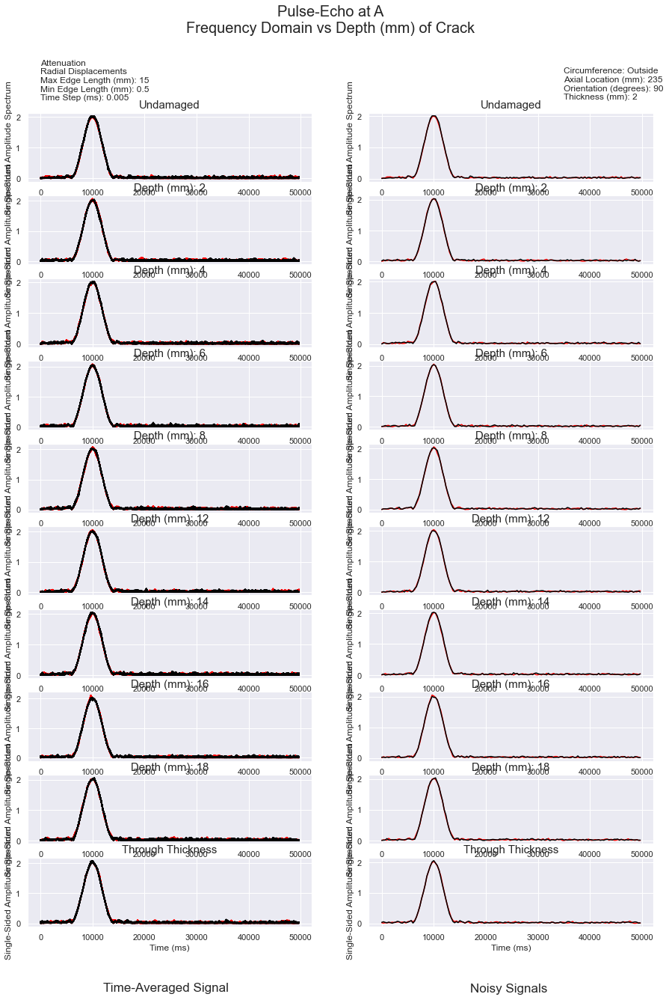

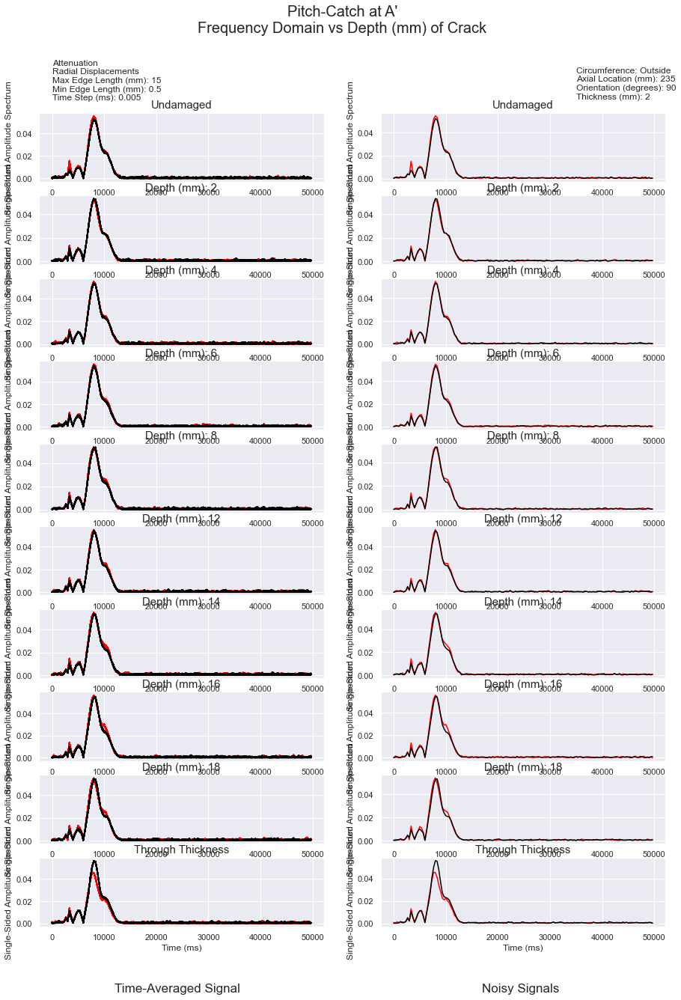

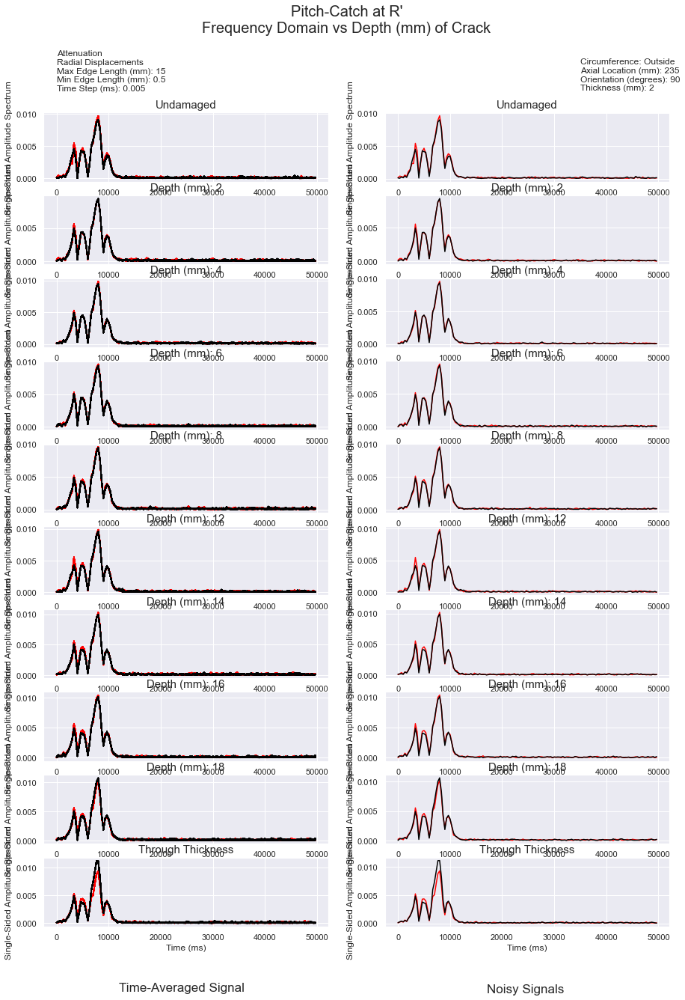

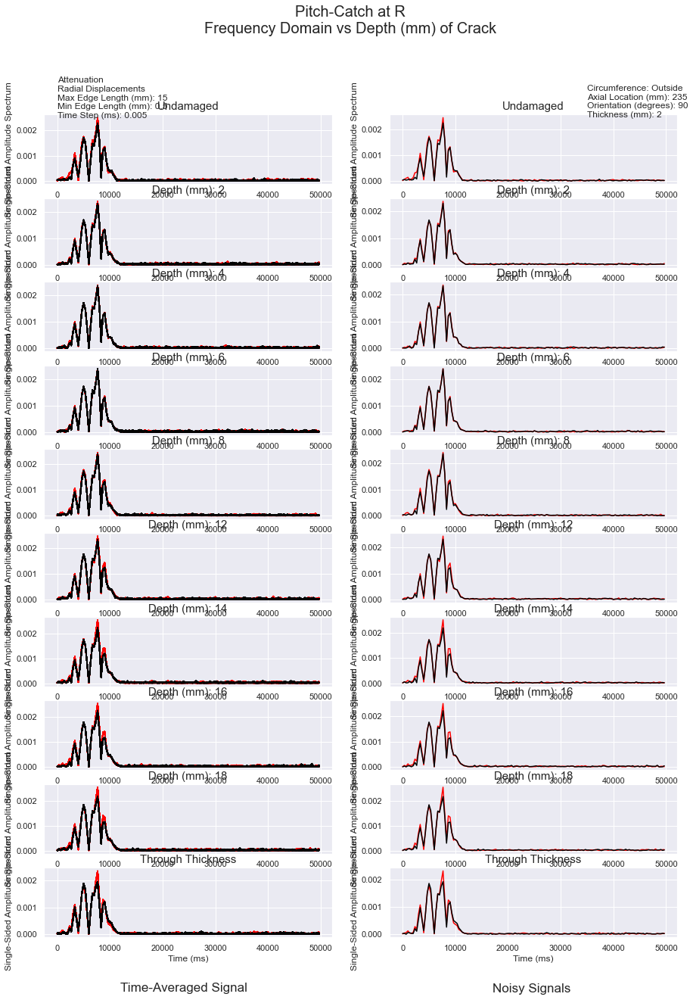

In [776]:
for Array in signals.keys():
    
    if Array == 'A':
        Configuration = 'Pulse-Echo'
    else:
        Configuration = 'Pitch-Catch'
    
    fig, ax = plt.subplots(no_ds, 2, figsize = (15,20))
    i = 0
    
    while i < no_ds:
        state = states[i]
        j = 0;
        subtitle = '';
        
        while j < no_axes:
            axis = axes[j];

            is_state = signals[Array]['Crack Properties',variable] == states[i];
            is_axis  = signals[Array]['Transducer','Axis'] == float(axes[j]);
            signal   = signals[Array][is_state & is_axis];

            signal_freq = signal['Frequency Domain (Hz)'];
            
            if np.nan in signal_freq:
                continue

            max_value = signal_freq.to_numpy().max()
            
            ax[i][0].plot(signal_freq.columns,signal_freq.to_numpy().transpose() ,color = colors[j], label = 'Axis ' + str(Axes[j]));
            ax[i][0].set_ylabel('Single-Sided Amplitude Spectrum', fontsize = 12)

            j = j + 1;
            
        j = 0

        while j < no_axes:
            axis = axes[j];

            is_state = averaged_signals[Array]['Crack Properties',variable] == states[i];
            is_axis  = averaged_signals[Array]['Transducer','Axis'] == float(axes[j]);
            signal   = averaged_signals[Array][is_state & is_axis];

            signal_freq = signal['Frequency Domain (Hz)'];
            
            if np.nan in signal_freq:
                continue

            max_value = signal_freq.to_numpy().max()
            
            ax[i][1].plot(signal_freq.columns,signal_freq.to_numpy().transpose() ,color = colors[j], label = 'Axis ' + str(Axes[j]));
            ax[i][1].set_ylabel('Single-Sided Amplitude Spectrum', fontsize = 12)

            j = j + 1;

        if i == 0:
            subtitle = 'Undamaged'
        elif state >= 20:
            subtitle = 'Through Thickness'
        else:
            subtitle = variable + ': ' + str(states[i])
        ax[i][0].set_title(subtitle, fontsize = 15)
        ax[i][1].set_title(subtitle, fontsize = 15)
            
        i = i + 1;

    ax[-1][0].set_xlabel('Time (ms)', fontsize = 12)
    ax[-1][1].set_xlabel('Time (ms)', fontsize = 12)
    
    textyloc = max_value*1.1;

    ax[0][0].text(0, textyloc, parameters, fontsize=12)
    ax[0][-1].text(35000, textyloc, crack_props, fontsize=12)
    
    ax[-1][0].text(12000, -1*textyloc, 'Time-Averaged Signal', fontsize = 17)
    ax[-1][1].text(17000, -1*textyloc, 'Noisy Signals', fontsize = 17)

    fig.suptitle(Configuration + ' at '+ Array +'\nFrequency Domain vs ' + variable + ' of Crack',fontsize = 20)

    fig.savefig(Array + ' ' + savename,dpi = 250)

In [777]:
savename = Pipe_model + ' Noisy Response ' + Elasticity + ' ' + disps + ' ' + str(meshmin) + '-' + str(meshmax) + ' mm Mesh ' + str(timestep) + ' ms Timestep'
savename += '.png'
savename

'Comsol 6.0 Model Noisy Response Attenuation Radial Displacements 0.5-15 mm Mesh 0.005 ms Timestep.png'

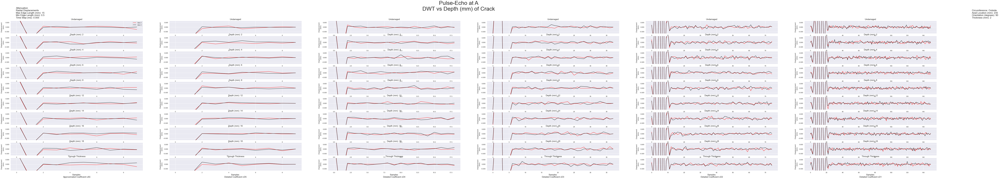

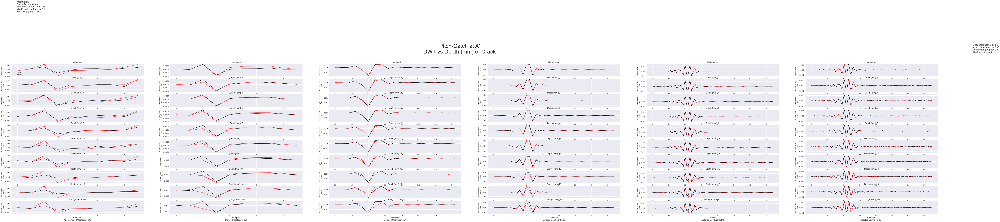

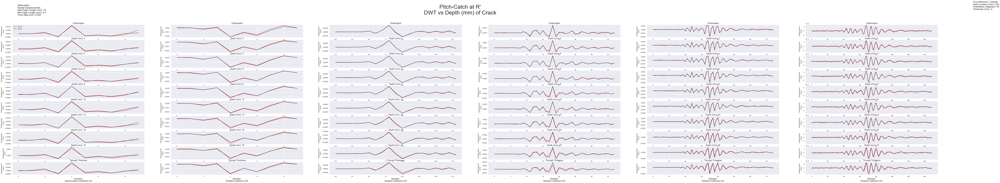

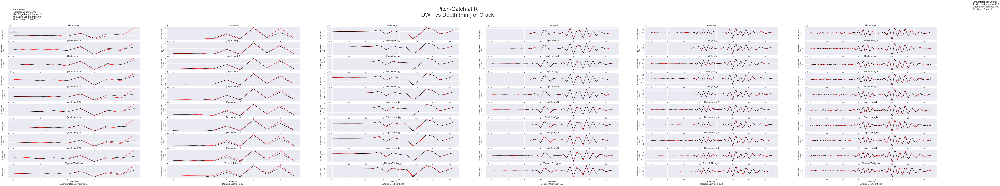

In [778]:
for Array in averaged_signals.keys():
    
    if Array == 'A':
        Configuration = 'Pulse-Echo'
    else:
        Configuration = 'Pitch-Catch'
    
    fig, ax = plt.subplots(no_ds, no_coeffs, figsize = (120,20))
    i = 0
    
    while i < no_ds:
        state = states[i]
        j = 0;
        subtitle = '';

        while j < no_axes:
            axis = axes[j];

            is_state = averaged_signals[Array]['Crack Properties',variable] == states[i];
            is_axis  = averaged_signals[Array]['Transducer','Axis'] == float(axes[j]);
            signal   = averaged_signals[Array][is_state & is_axis];

            signal_time = signal['Time Domain (ms)'];
            
            if np.nan in signal_time:
                continue

            max_value = signal_time.to_numpy().max()
            
            coeffs = pywt.wavedec(signal_time, 'db1', mode = 'sym', level = 5); # DWT
            cA5, cD5, cD4, cD3, cD2, cD1 = coeffs
            
            k = 0
            for coeff in coeffs:
                
                if Configuration == 'Pulse-Echo':
                    ax[i][k].set_ylim([-0.007, 0.007])
                
                samples = np.arange(0,len(coeff.transpose()))
                ax[i][k].plot(samples,coeff.transpose() ,color = colors[j], label = 'Axis ' + str(Axes[j]));
                ax[i][k].set_ylabel('Displacement \n(mm)', fontsize = 12)
                                
                if i == 0:
                    subtitle = 'Undamaged'
                elif state >= 20:
                    subtitle = 'Through Thickness'
                else:
                    subtitle = variable + ': ' + str(states[i])
                ax[i][k].set_title(subtitle, fontsize = 15)

                k = k + 1;

            j = j + 1;
            
        i = i + 1;


    ax[0][0].legend(loc = 'best', ncol = 1)
    
    if Configuration == 'Pulse-Echo':
        textyloc = 0.007;
    else:
        textyloc = max_value;

    ax[-1][0].set_xlabel('Samples \nApproximated Coefficient cA5', fontsize = 15)
    ax[-1][1].set_xlabel('Samples \nDetailed Coefficient cD5', fontsize = 15)
    ax[-1][2].set_xlabel('Samples \nDetailed Coefficient cD4', fontsize = 15)
    ax[-1][3].set_xlabel('Samples \nDetailed Coefficient cD3', fontsize = 15)
    ax[-1][4].set_xlabel('Samples \nDetailed Coefficient cD2', fontsize = 15)
    ax[-1][5].set_xlabel('Samples \nDetailed Coefficient cD1', fontsize = 15)
        
    ax[0][0].text(-0.05, textyloc, parameters, fontsize=17)
    ax[0][-1].text(200, textyloc, crack_props, fontsize=17)

    fig.suptitle(Configuration + ' at '+ Array +'\nDWT vs ' + variable + ' of Crack',fontsize = 40)

    # fig.savefig(Array + ' ' + savename,dpi = 250)

## Principal Component Analysis

Objective: Classify the noisy damage data via the amplitude of the frequency. 

Begin by zeroing in on only the frequencies which best describe teh signal. For our purposes, this will be the frequencies between 7,000 Hz and 13,000 Hz.

In [779]:
imp_freqs = []
for freq in list(P1['Frequency Domain (Hz)'].columns):
    if (freq >= 7000):
        if (freq <= 12000):
            imp_freqs.append(freq)

Define the color markers for each damaged state

In [780]:
colors_index = [0] * 20 
colors_index[0:len(states)] = states
colors = {colors_index[0]:'black', 
          colors_index[1]:'blue', 
          colors_index[2]:'green', 
          colors_index[3]:'purple', 
          colors_index[4]:'red', 
          colors_index[5]:'magenta', 
          colors_index[6]:'cyan', 
          colors_index[7]:'black',
          colors_index[8]:'pink',
          colors_index[9]:'orange',
          colors_index[10]:'olive',
          colors_index[11]:'gray',
          colors_index[12]:'maroon',
          colors_index[13]:'darkgreen'}

colors

{0: 'darkgreen',
 2: 'blue',
 4: 'green',
 6: 'purple',
 8: 'red',
 12: 'magenta',
 14: 'cyan',
 16: 'black',
 18: 'pink',
 20: 'orange'}

Plot all frequency domains on one graph per transducer array. Color-code them by damaged state. We're examining Axis 2, the axis with the crack.

Run a preliminary PCA analysis on the frequency domains to transform the data to a 2-PC space. Obtain the amount of variance from the original dataset explained by the principal components.

Finally, plot the transducer frequency response on the transformed plane. Because the variance is explained concisely with just two principal components, it should be much easier to cluster the damaged states on the transformed plane. 

In [781]:
savename1 = Pipe_model + ' Damaged State as a Function of Frequency Variables '
savename1 += '.png'
savename1

savename2 = Pipe_model + ' Preliminary PCA '
savename2 += '.png'
savename2

savename3 = Pipe_model + ' Damaged State as a Function of Principal Components '
savename3 += '.png'
savename3

'Comsol 6.0 Model Damaged State as a Function of Principal Components .png'

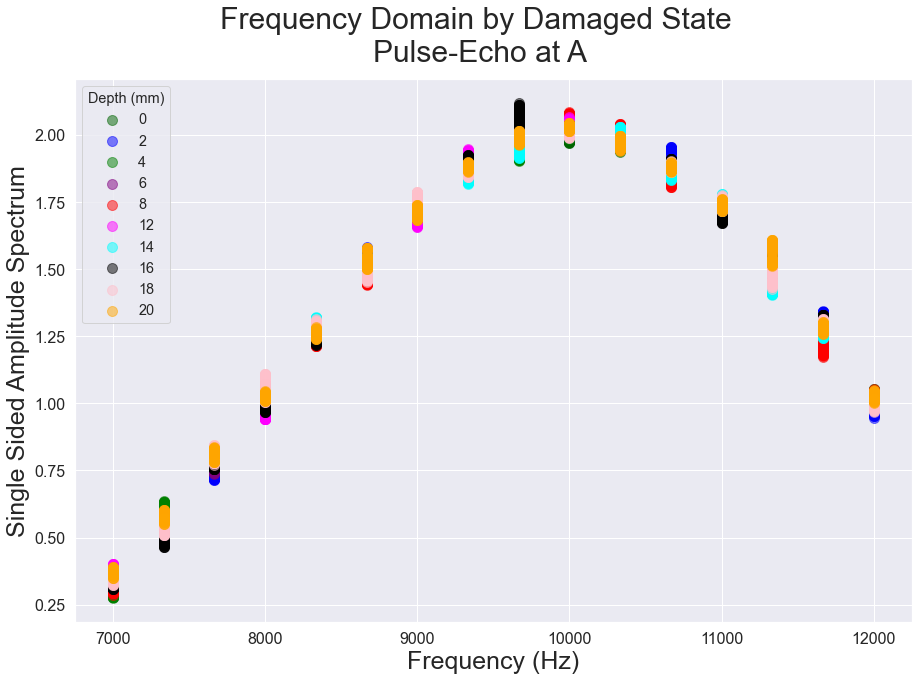

original shape:    (1010, 16)
transformed shape: (1010, 2)
Variance explained by each principal component 
PC1: 0.3163603882333231 
PC2: 0.16709706649923156


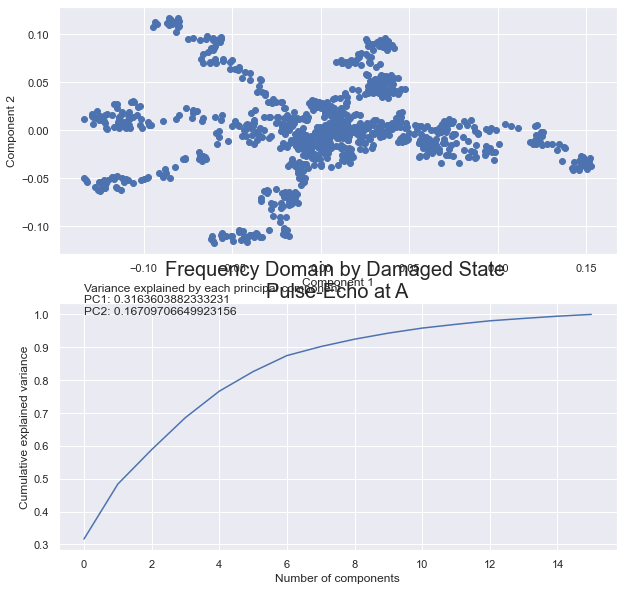

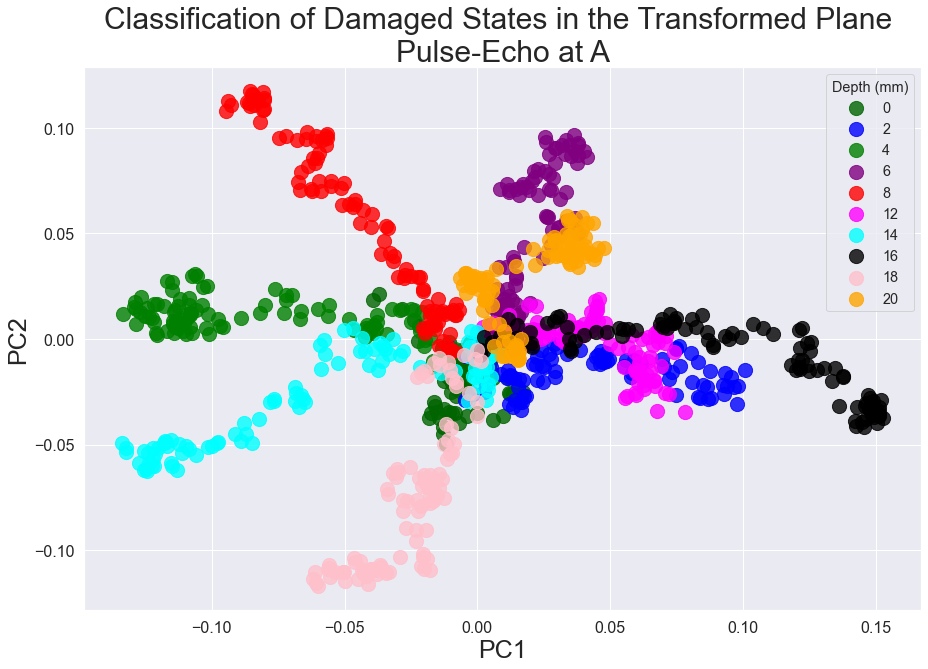

C:\Users\MEH-3\Anaconda_Python\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\MEH-3\Anaconda_Python\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\MEH-3\Anaconda_Python\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Pulse-Echo at A
Number of Principal Components = 7
Accuracy of Classification = 99.2%
Accuracy List = 0.35177865612648224, 0.7233201581027668, 0.9288537549407114, 0.9604743083003953, 0.9841897233201581, 0.9881422924901185, 0.9920948616600791, 0.9920948616600791, 0.9920948616600791, 0.9920948616600791, 0.9920948616600791, 0.9881422924901185


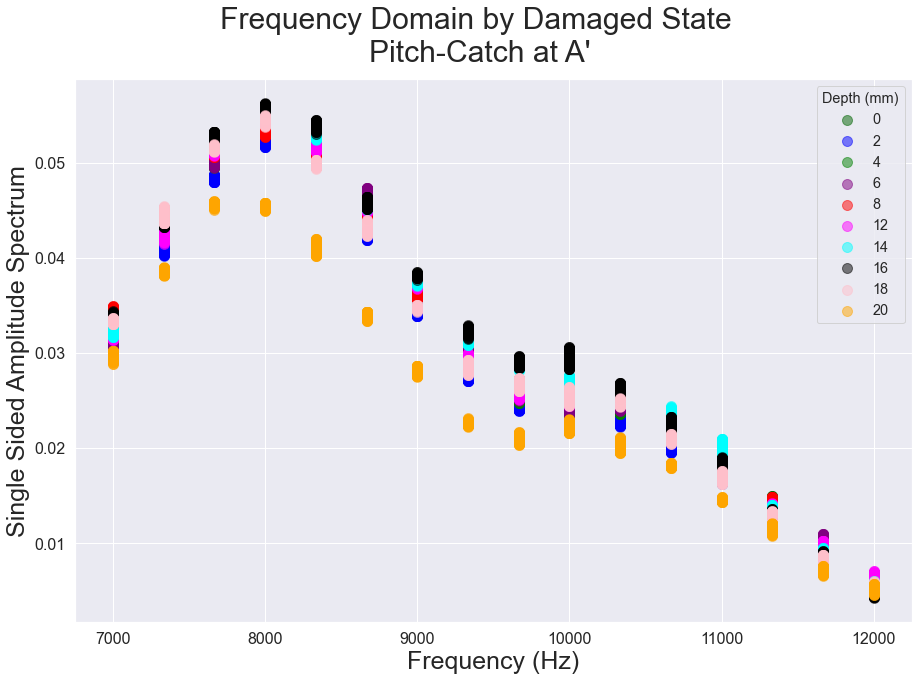

original shape:    (1010, 16)
transformed shape: (1010, 2)
Variance explained by each principal component 
PC1: 0.8577823084882357 
PC2: 0.07366155683159976


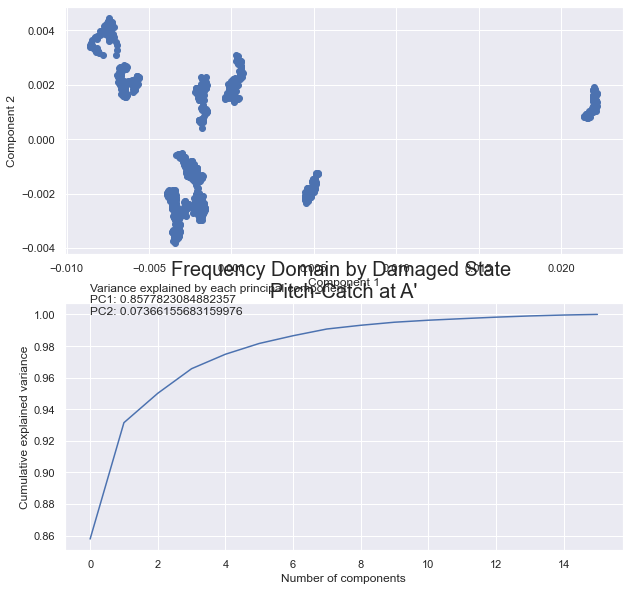

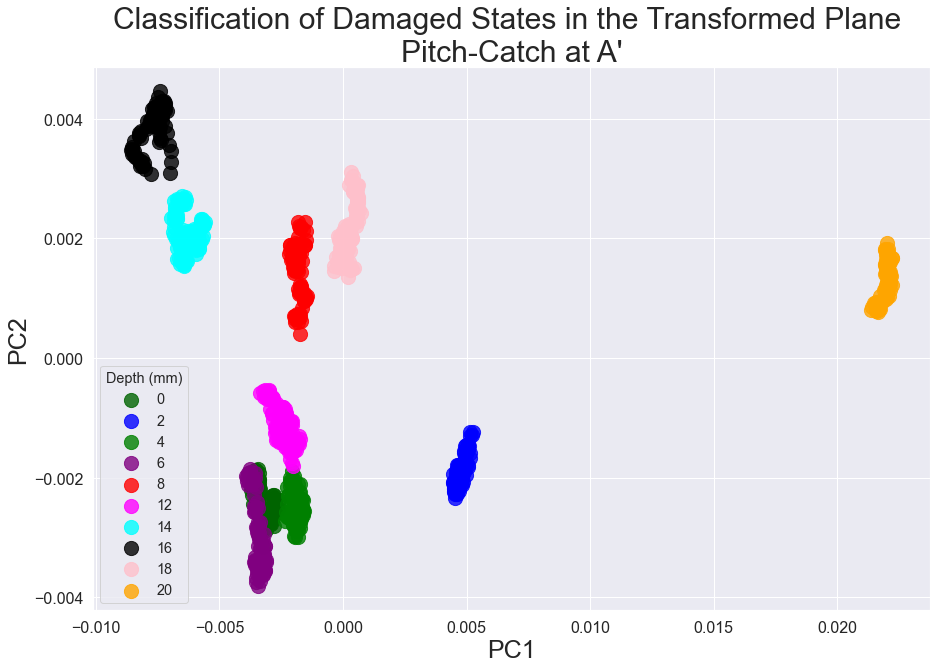

Pitch-Catch at A'
Number of Principal Components = 4
Accuracy of Classification = 100.0%
Accuracy List = 0.5770750988142292, 0.9407114624505929, 0.9920948616600791, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0


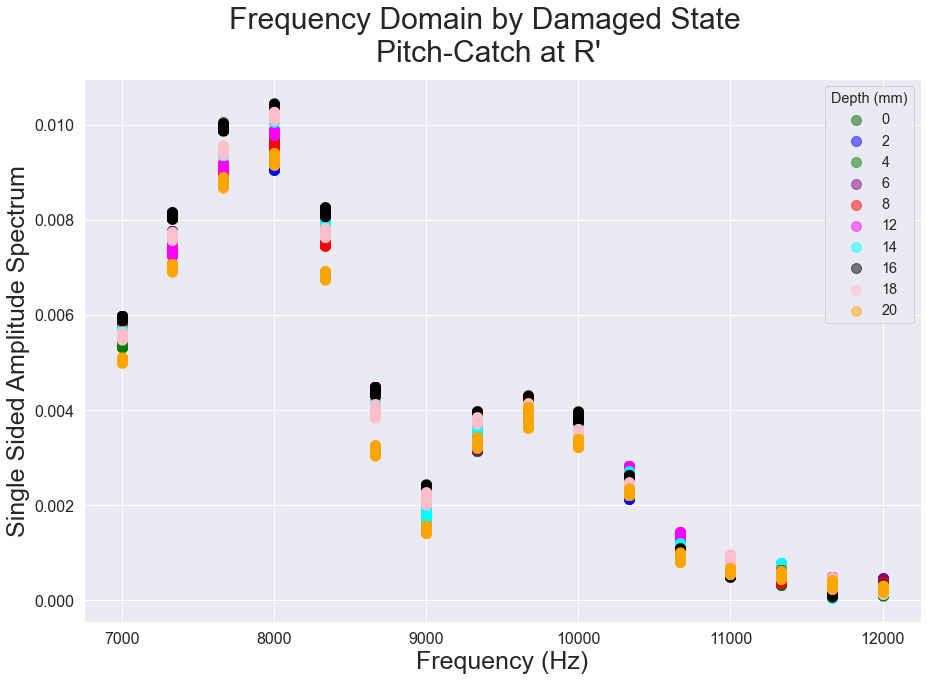

original shape:    (1010, 16)
transformed shape: (1010, 2)
Variance explained by each principal component 
PC1: 0.6604028954215942 
PC2: 0.19281331277092476


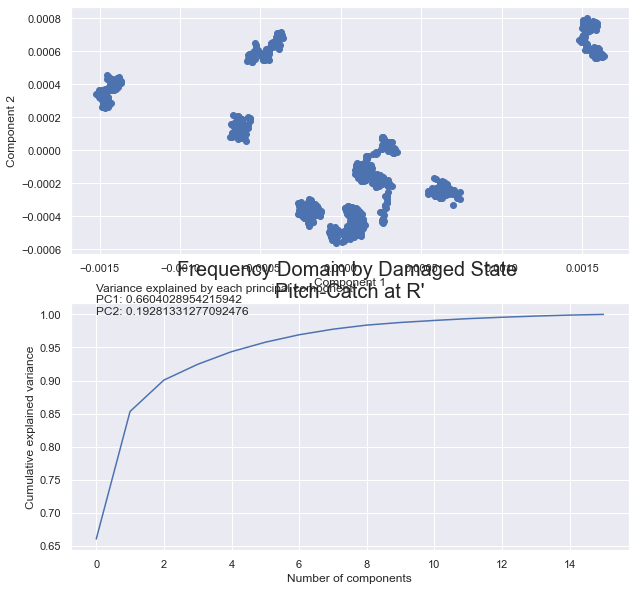

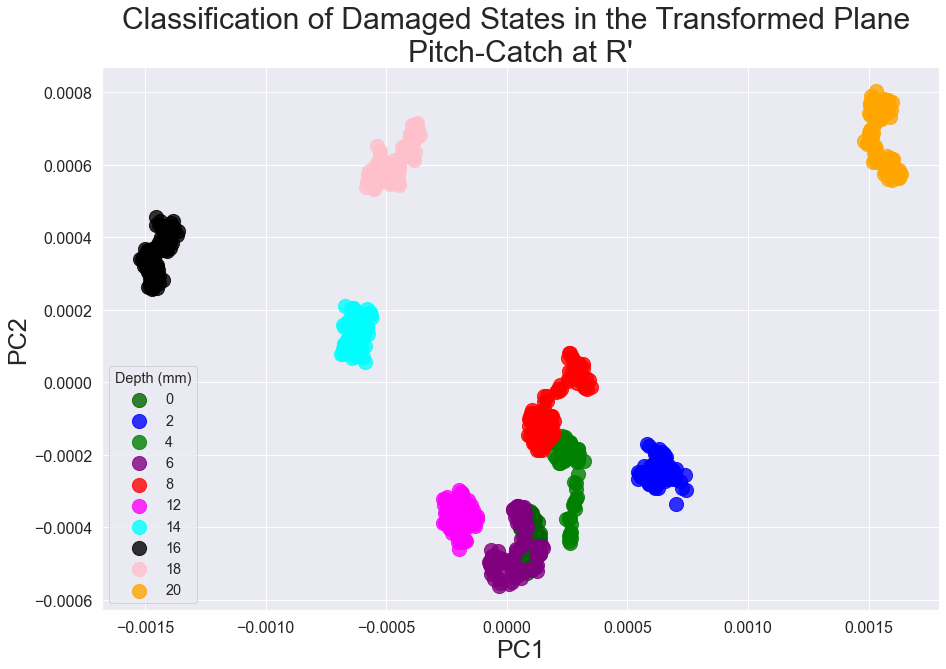

Pitch-Catch at R'
Number of Principal Components = 3
Accuracy of Classification = 100.0%
Accuracy List = 0.8102766798418972, 0.9525691699604744, 1.0, 0.9960474308300395, 1.0, 0.9960474308300395, 0.9960474308300395, 1.0, 1.0, 1.0, 1.0, 1.0


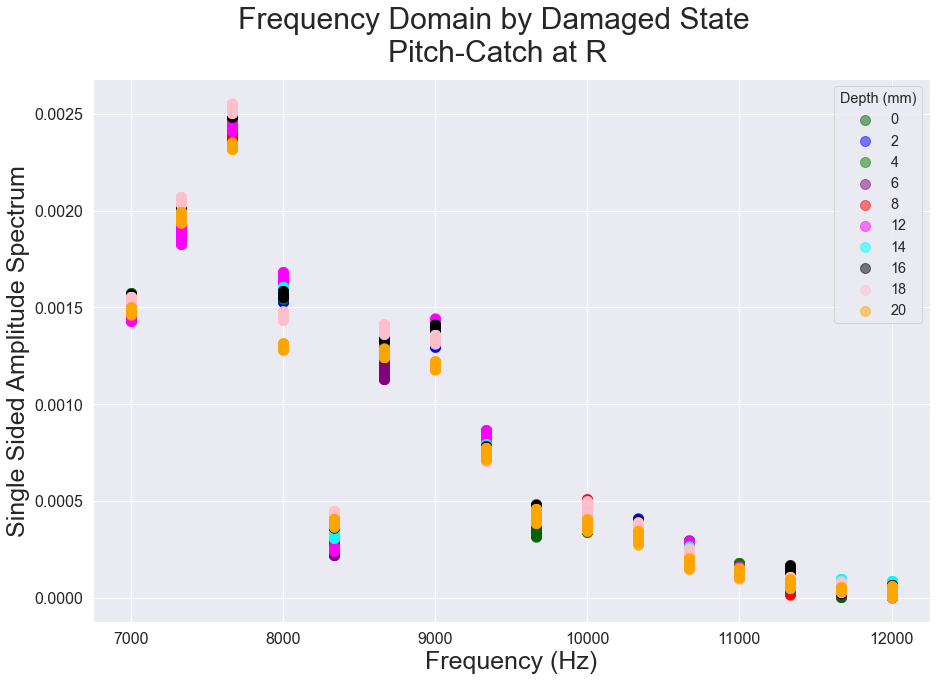

original shape:    (1010, 16)
transformed shape: (1010, 2)
Variance explained by each principal component 
PC1: 0.4495174428974602 
PC2: 0.3535480340827522


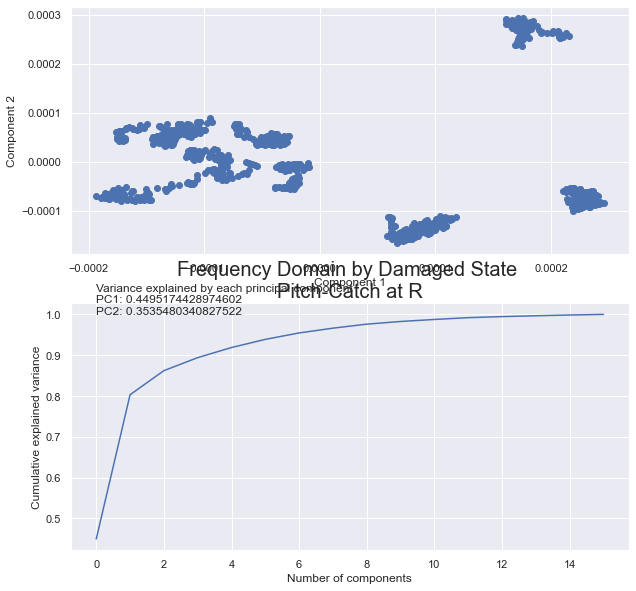

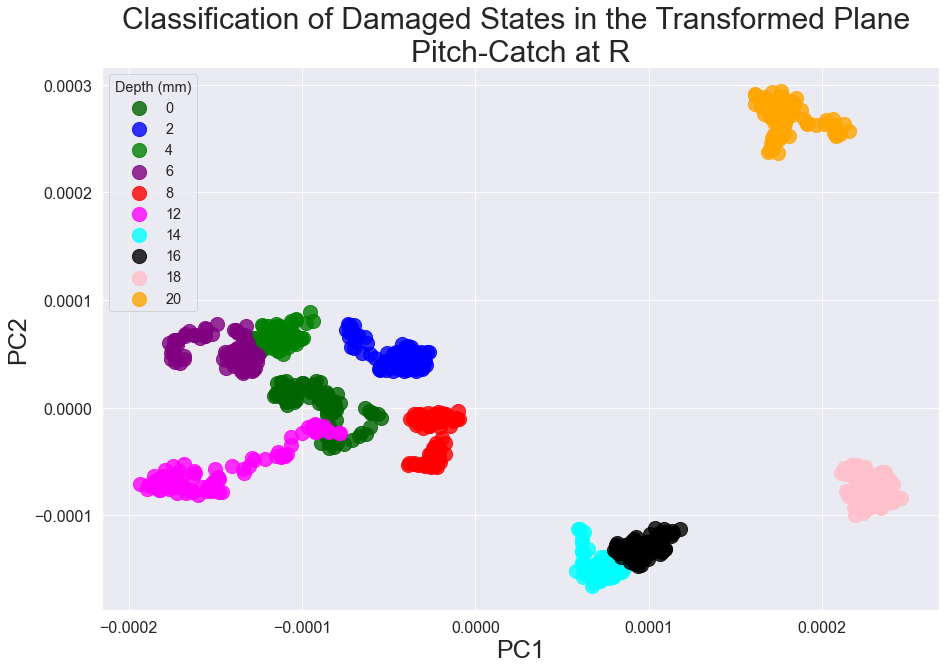

KeyboardInterrupt: 

In [782]:
all_pcs = {}
pc_data = {}

for Array in signals.keys():
    
    if Array == 'A':
        Configuration = 'Pulse-Echo'
    else:
        Configuration = 'Pitch-Catch'

    is_axis        = signals[Array]['Transducer','Axis'] == 2;
    interest_freqs = signals[Array][is_axis]['Frequency Domain (Hz)'][imp_freqs]
    interest_freqs[variable] = signals[Array][is_axis]['Crack Properties', variable]

    states = interest_freqs[variable].unique()
    
    # Plot the frequency domains
    fig, ax = plt.subplots(figsize = (15,10))
    
    max_value = max(max_signals[Array]['Frequency Domain (Hz)'].max())

    for freq in imp_freqs:
        for state in states:
            c = colors[state]
            x1 = np.ones(len(interest_freqs[interest_freqs[variable] == state][freq].index));
            x1 = x1*freq;
            plt.scatter(x = x1, y = interest_freqs[interest_freqs[variable] == state][freq], alpha = 0.5, color = c, s = 100)
            
    # ax.text(imp_freqs[0], max_value*1.2, parameters, fontsize=17)
    # ax.text(imp_freqs[0]+(imp_freqs[-1]-imp_freqs[0])*5/6, max_value*1.2, crack_props, fontsize=17)
    
    plt.legend(states, title = variable, loc = 'best', fancybox = True, fontsize = 'large', title_fontsize = 'large');
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontsize(16)    
    plt.ylabel('Single Sided Amplitude Spectrum', fontsize = 25)
    plt.xlabel('Frequency (Hz)', fontsize = 25)    
    fig.suptitle('Frequency Domain by Damaged State \n' + Configuration + ' at ' + Array, fontsize = 30)
    plt.grid(which='major', linestyle='-')    
    plt.show()
    
    fig.savefig(Array + ' ' + savename1,dpi = 250)
    
    # Plot the preliminary results and cumulative explained variance vs number of PCs
    freq_pca, comps, transformed_freq = prePCA(interest_freqs.drop(variable, axis = 1))
    plt.title('Frequency Domain by Damaged State \n' + Configuration + ' at ' + Array, fontsize = 20)
    plt.grid(which='major', linestyle='-')    
    plt.show()
    
    reduced_dataset = pd.DataFrame(transformed_freq)
    reduced_dataset.columns = ['Principal Component 1', 'Principal Component 2']
    interest_freqs.reset_index(drop=True, inplace=True)
    reduced_dataset.reset_index(drop=True, inplace=True)
    reduced_dataset[variable] = interest_freqs[variable]
    reduced_dataset.set_index(variable)
    
    pc_data[Array] = reduced_dataset
    
    pcs         = pd.DataFrame(comps)
    pcs.columns = imp_freqs
    pcs.index   = ['PC1','PC2']
    pcs
    
    all_pcs[Array] = pcs
    
    # print('Principal Components: '+comps)
    
    fig.savefig(Array + ' ' + savename2,dpi = 250)
    
    # Plot the damage data on the transformed plane and color code them by damaged state
    fig, ax = plt.subplots(figsize = (15,10))

    for state in states:
        x = reduced_dataset[reduced_dataset[variable] == state]['Principal Component 1'];
        y = reduced_dataset[reduced_dataset[variable] == state]['Principal Component 2'];
        c = colors[state];
        plt.scatter(x = x, y = y, alpha = 0.8, color = c, s= 200); 

    plt.legend(colors.keys(), title = variable, loc = 'best', fancybox = True, fontsize = 'large', title_fontsize = 'large');
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontsize(16)    
    plt.ylabel('PC2', fontsize = 25)
    plt.xlabel('PC1', fontsize = 25)    
    plt.title('Classification of Damaged States in the Transformed Plane \n' + Configuration + ' at ' + Array , fontsize = 30)
    plt.grid(which='major', linestyle='-')    
    plt.show()
    
    fig.savefig(Array + ' ' + savename3,dpi = 250)
    
    # Perform an SVM to determine the ideal number of PCs for best accuracy
    scaler = StandardScaler()
    x = scaler.fit_transform(interest_freqs)
    y = interest_freqs[variable]

    Xtrain, Xtest, ytrain, ytest = train_test_split(x, y, random_state=42)

    classification_list = []
    accuracy_list = []
    transformed_data_list = []
    models = {}

    for i in range(1,13):
        classification, accuracy, transformed_data, model = pca_svm(n_components = i)
        classification_list.append(classification)
        accuracy_list.append(accuracy)
        transformed_data_list.append(transformed_data)
        models[i] = model
        
    max_acc = max(accuracy_list)
    num_PCs = accuracy_list.index(max_acc)+1

    max_acc = float("{:.3f}".format(max_acc))
    print(color.BOLD + Configuration + ' at ' + Array + 
          "\nNumber of Principal Components = " + str(num_PCs) +
          '\n' + "Accuracy of Classification = " + str(max_acc*100) + "%"
          '\n' "Accuracy List = " + str(accuracy_list)[1:-1] + color.END)

In [783]:
all_pcs['A\'']

,7000.000000,7333.333333,7666.666667,8000.000000,8333.333333,8666.666667,9000.000000,9333.333333,9666.666667,10000.000000,10333.333333,10666.666667,11000.000000,11333.333333,11666.666667,12000.000000
PC1,-0.112536,-0.196806,-0.237777,-0.348798,-0.433815,-0.432342,-0.349213,-0.297853,-0.239538,-0.179201,-0.190440,-0.163069,-0.152136,-0.065521,-0.068612,-0.011256
PC2,0.257360,0.149153,0.174801,-0.090894,-0.265600,-0.409951,-0.198409,0.170243,0.407768,0.548072,0.240261,0.072886,0.028151,-0.075360,-0.126899,-0.116102


The coordinates on the 2 PCs plane and the damaged states are stored for each datapoint on each array. This will be used in the machine learning script.

In [784]:
pc_data['A\''] = pc_data['A\''].set_index(variable)
pc_data['A\'']

,Principal Component 1,Principal Component 2
Depth (mm),,
0,-0.002897,-0.002658
2,0.004992,-0.001948
4,-0.001800,-0.002103
6,-0.003549,-0.001912
8,-0.001753,0.000398
...,...,...
20,0.021549,0.000911
20,0.021495,0.000927
20,0.021421,0.000861


## Machine Learning

We will be applying the support vector machine (SVM) method to increase the dimensionality of the PCA results, mathematically group all the datapoints between characteristic hyperplanes, verify the accuracy of the results, and save a model for later validation and use.

Begin by extracting samples from the generated dictionaries to form data arrays and target vectors.

In [785]:
x = pc_data['A\''][pc_data['A\''].columns].values

In [786]:
y = pc_data['A\''].index;
y.unique()

Int64Index([0, 2, 4, 6, 8, 12, 14, 16, 18, 20], dtype='int64', name='Depth (mm)')

Standardize the data and transform it to a dataset of z-scores

In [787]:
scaler = StandardScaler()
X = scaler.fit_transform(x)
X

array([[-0.36253585, -1.13503119],
       [ 0.62467425, -0.83165753],
       [-0.22531213, -0.89806502],
       ...,
       [ 2.68058325,  0.36779546],
       [ 2.69159459,  0.38580252],
       [ 2.67442632,  0.34202629]])

In [788]:
import sklearn.svm as svm

The support vector classifier (SVC) is the border between any two classes in the native dimension of the dataset. In the higher dimension, it is known as the hyperplane. 
A decision function shape of ovo means that the SVC selection method is one-vs-one. This means that one SVC exists between any pair of classes. The total number of SVCs in this case is n*(n-1)/2, where is is the number of classes.
Alternatively, there is a selection method known as ovr (one-vs-rest). This means that one SVC exist between any one class and all other classes. The total number of SVCs in this case is n.

In [789]:
clf = svm.SVC(decision_function_shape='ovo')
clf.fit(X, y)

SVC(decision_function_shape='ovo')

In [790]:
Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, random_state=42)

C is a parameter which toggles the cost of misclassification. A low value of C means that the data has high bias and low variability. Limit as you approach zero is complete data overfit. A high value of C means the data has low bias and high variability. The objective is to try and find a sweet spot so that the data is well classified while allowing for some misclassifications and can accurately classify test data into the model from the train dataset. 

Gamma is a parameter linked to the rbf kernel. In the higher dimension examined in the SVM algorithm, the terrain of the points is more spiky when gamma is lower and more smooth when gamma is higher. Low gamma means low bias and high variance, and high gamma means high bias and low variance. Gamma is always between zero and one, in which gamma of zero is a completely overfitted model and gamma of one is a model where the data points have no influence on the hyperplanes.

Specify a number of C and gamma values that you wish to test, and examine every combination by using cross validation by GridSearchCV. Also provide a value for cv, the number of folds of cross validation. 

In [791]:
param_grid = {'C': np.logspace(np.log10(0.001), np.log10(20), num=200),
              'gamma': ['auto'],
              'kernel': ['rbf']}
grid = GridSearchCV(SVC(), param_grid, cv = 5, verbose = 0)
grid

GridSearchCV(cv=5, estimator=SVC(),
             param_grid={'C': array([1.00000000e-03, 1.05102541e-03, 1.10465441e-03, 1.16101986e-03,
       1.22026137e-03, 1.28252571e-03, 1.34796711e-03, 1.41674769e-03,
       1.48903782e-03, 1.56501659e-03, 1.64487220e-03, 1.72880248e-03,
       1.81701534e-03, 1.90972929e-03, 2.00717401e-03, 2.10959089e-03,
       2.21723363e-03, 2.33036889e-03, 2.44927691e-03, 2.574252...
       6.36687064e+00, 6.69174283e+00, 7.03319176e+00, 7.39206325e+00,
       7.76924632e+00, 8.16567530e+00, 8.58233223e+00, 9.02024926e+00,
       9.48051118e+00, 9.96425816e+00, 1.04726885e+01, 1.10070618e+01,
       1.15687016e+01, 1.21589993e+01, 1.27794173e+01, 1.34314923e+01,
       1.41168397e+01, 1.48371572e+01, 1.55942293e+01, 1.63899312e+01,
       1.72262342e+01, 1.81052099e+01, 1.90290356e+01, 2.00000000e+01]),
                         'gamma': ['auto'], 'kernel': ['rbf']})

In [792]:
grid.fit(Xtrain, ytrain)
print(grid.best_params_)

{'C': 1.2322246613684977, 'gamma': 'auto', 'kernel': 'rbf'}


In [793]:
clf_svm = SVC(C = grid.best_params_['C'], gamma = grid.best_params_['gamma'], random_state = 42)
clf_svm.fit(Xtrain, ytrain)

SVC(C=1.2322246613684977, gamma='auto', random_state=42)

In [794]:
ypred = clf_svm.predict(Xtest)

In [795]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix

array(<sklearn.metrics._plot.confusion_matrix.ConfusionMatrixDisplay object at 0x0000020FA784FBB0>,
      dtype=object)

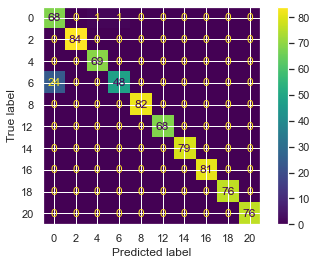

In [796]:
cm_train = plot_confusion_matrix(clf_svm, Xtrain, ytrain, display_labels = y.unique())
cm_train = np.array(cm_train)
cm_train

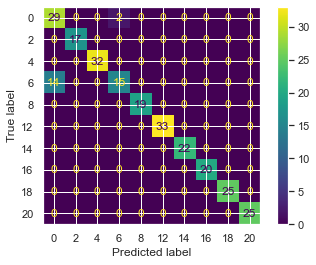

In [797]:
plot_confusion_matrix(clf_svm, Xtest, ytest, display_labels = y.unique())

In [798]:
colors_index = [0] * 20 
colors_index[0:len(states)] = states
colors = {colors_index[0]:'black', 
          colors_index[1]:'blue', 
          colors_index[2]:'green', 
          colors_index[3]:'purple', 
          colors_index[4]:'red', 
          colors_index[5]:'magenta', 
          colors_index[6]:'cyan', 
          colors_index[7]:'black',
          colors_index[8]:'pink',
          colors_index[9]:'orange',
          colors_index[10]:'olive',
          colors_index[11]:'gray',
          colors_index[12]:'maroon',
          colors_index[13]:'darkgreen'}

colors

{0: 'darkgreen',
 2: 'blue',
 4: 'green',
 6: 'purple',
 8: 'red',
 12: 'magenta',
 14: 'cyan',
 16: 'black',
 18: 'pink',
 20: 'orange'}

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

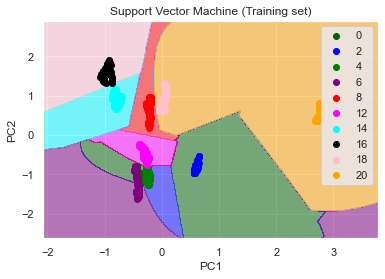

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

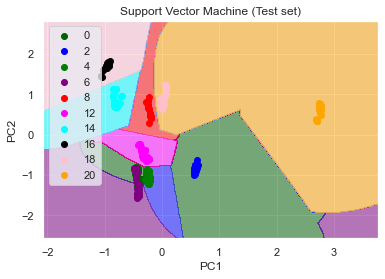

In [799]:
# Visualising the Training set results

from matplotlib.colors import ListedColormap

X_Set, Y_Set = Xtrain, ytrain
X1, X2 = np.meshgrid(np.arange(start = X_Set[:, 0].min() - 1, stop = X_Set[:, 0].max() + 1, step = 0.01),
                     np.arange(start = X_Set[:, 1].min() - 1, stop = X_Set[:, 1].max() + 1, step = 0.01))
plt.contourf(X1, X2, clf_svm.predict(np.array([X1.ravel(), X2.ravel()]).T).reshape(X1.shape),
             alpha = 0.5, cmap = ListedColormap(('darkgreen', 'blue','green','purple','red', 'magenta', 'cyan', 'black', 'pink', 'orange')))
plt.xlim(X1.min(), X1.max())
plt.ylim(X2.min(), X2.max())
for i, j in enumerate(np.unique(Y_Set)):
    plt.scatter(X_Set[Y_Set == j, 0], X_Set[Y_Set == j, 1],
                c = ListedColormap(('darkgreen', 'blue','green','purple','red', 'magenta', 'cyan', 'black', 'pink', 'orange'))(i), label = j)
plt.title('Support Vector Machine (Training set)')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend()
plt.show()

# Visualising the Test set results

from matplotlib.colors import ListedColormap
X_Set, Y_Set = Xtest, ytest
X1, X2 = np.meshgrid(np.arange(start = X_Set[:, 0].min() - 1, stop = X_Set[:, 0].max() + 1, step = 0.01),
                     np.arange(start = X_Set[:, 1].min() - 1, stop = X_Set[:, 1].max() + 1, step = 0.01))
plt.contourf(X1, X2, clf_svm.predict(np.array([X1.ravel(), X2.ravel()]).T).reshape(X1.shape),
             alpha = 0.5, cmap = ListedColormap(('darkgreen', 'blue','green','purple','red', 'magenta', 'cyan', 'black', 'pink', 'orange')))
plt.xlim(X1.min(), X1.max())
plt.ylim(X2.min(), X2.max())
for i, j in enumerate(np.unique(Y_Set)):
    plt.scatter(X_Set[Y_Set == j, 0], X_Set[Y_Set == j, 1],
                c = ListedColormap(('darkgreen', 'blue','green','purple','red', 'magenta', 'cyan', 'black', 'pink', 'orange'))(i), label = j)
plt.title('Support Vector Machine (Test set)')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend()
plt.show()

In [ ]:
colors.items()

In COMSOL, if you define the linear elasticity of the model using K and G as opposed to E and nu, the speed of the waves changes